In [43]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import scipy
from scipy import integrate, optimize
from scipy.stats import chi2
from iminuit import minimize, Minuit
from tqdm import tqdm

## Parameters definition
1. bins related parameters (reconstucted top mass)
* top_bins_width (int): The width of each bin
* top_bins_min (int): The minimum reco top mass (GeV)
* top_bins_max (int): The maximum reco top mass (GeV)
* top_bins (array): The boundary of each bin i.g. 120, 121, 122
* top_bins_mid(array): The central value of bins, it will be generated automatically
* top_bins_dense: Dense version of bins, which is used to draw fitted line

2. bins related parameters (reconstucted W mass)
* W_bins_width (int): The width of each bin
* W_bins_min (int): The minimum W mass (GeV)
* W_bins_max (int): The maximum W mass (GeV)
* W_bins (array): The boundary of each bin
* W_bins_mid(array): The central value of bins, it will be generated automatically
* W_bins_dense: Dense version of bins, which is used to draw fitted line

3. True top mass related parameters
* mass: True top mass
* top_mass_dense: Densly true top mass that is used to show the fit result

4. JSF related parameters
* JSF_arr: JSF arr that generates
* JSF_dense: Densly JSF that is used to show the fit result

5. Other parameters
* loglikeli_cut: klfitter loglikelihood cut, range between -80 to -50
* marginal_prob_cut: spanet marginal probility cut, range between 0 to 1
* tot_event: Total number of sudo experiment

6. Settings
* colors: Control the color of drawings
* state_labels: The label of three states
* langau_fit_labels: The label of parameters for incorrect and unmatched pdf fit

In [2]:
# Fixed the bins, colors, mass arr, and labels for all plots.
# 1. bins related parameters (reconstucted top mass)
bins_width = 1
top_bins_min, top_bins_max = 120, 230
top_bins = np.arange(top_bins_min, top_bins_max+1, bins_width)
top_bins_mid = top_bins[:-1]+bins_width/2
top_bins_dense = np.linspace(top_bins_min, top_bins_max, 1000)

# 2. bins related parameters (reconstucted W mass)
W_bins_min, W_bins_max = 40, 120
W_bins = np.arange(W_bins_min, W_bins_max+1, bins_width)
W_bins_mid = W_bins[:-1]+bins_width/2
W_bins_dense = np.linspace(W_bins_min, W_bins_max, 1000)

# 3. True top mass related parameters
mass = [170, 171, 172, 173, 174, 175, 176]
top_mass_dense = np.linspace(170, 176, 1000)

# 4. JSF related parameters
JSF_arr = [0.97, 0.98, 0.99, 1.0, 1.01, 1.02, 1.03]
JSF_dense = np.linspace(0.97, 1.03, 1000)

# 5. Other paramters
loglikeli_cut_min = -78
loglikeli_cut_max = -55
marginal_prob_cut = 0.23
sudo_event = 1000

# 6. Settings
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
state_labels = ['Unmatched', 'Incorrect', 'Correct']
langau_fit_labels = ['Mean of Landau', 'Variance of Landau', 'Mean of Gaussian', 'Variance of Gaussian', 'Fraction of Gaussian']


## Function get_reco_top_mass
Input:
1. h5py_file (file containing the data)
2. target (klfitter, spanet, or true)
3. JSF

Output:
1. reconstructed top mass
2. reconstructed W mass
3. state (state of the top mass, 0 for unmatched, 1 for incorrect, and 2 for correct)
4. cuts: reco top mass cut (bins_min < reco top mass < bins_max)
5. loglikelihood value for klfitter; assignment, detection, and marginal probabilities for spanet

In [3]:
def get_reco_mass(h5py_file, target, JSF): # Target is spanet or klfitter
    dic = {}

    #Load pt, eta, phi, and mass from file. Where q1, q2 and b are the index.
    q1 = np.array([[i] for i in h5py_file[target + '/right_target/q1'][:]])
    dic['q1_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], q1, axis=1).flatten()
    dic['q1_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], q1, axis=1).flatten()
    dic['q1_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], q1, axis=1).flatten()
    dic['q1_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], q1, axis=1).flatten()

    q2 = np.array([[i] for i in h5py_file[target + '/right_target/q2'][:]])
    dic['q2_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], q2, axis=1).flatten()
    dic['q2_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], q2, axis=1).flatten()
    dic['q2_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], q2, axis=1).flatten()
    dic['q2_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], q2, axis=1).flatten()

    b = np.array([[i] for i in h5py_file[target + '/right_target/b'][:]])
    dic['b_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], b, axis=1).flatten()
    dic['b_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], b, axis=1).flatten()
    dic['b_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], b, axis=1).flatten()
    dic['b_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], b, axis=1).flatten()
    
    # px = pt*cos(phi)*JSF
    # py = pt*sin(phi)*JSF
    # pz = pt*sinh(eta)*JSF
    # E  = sqrt(m**2 + px**2 + py**2 + pz**2)
    dic['px1'] = dic['q1_pt']*np.cos(dic['q1_phi'])*JSF
    dic['py1'] = dic['q1_pt']*np.sin(dic['q1_phi'])*JSF
    dic['pz1'] = dic['q1_pt']*np.sinh(dic['q1_eta'])*JSF
    dic['E1'] = np.sqrt(dic['q1_mass']**2+dic['px1']**2+dic['py1']**2+dic['pz1']**2)

    dic['px2'] = dic['q2_pt']*np.cos(dic['q2_phi'])*JSF
    dic['py2'] = dic['q2_pt']*np.sin(dic['q2_phi'])*JSF
    dic['pz2'] = dic['q2_pt']*np.sinh(dic['q2_eta'])*JSF
    dic['E2'] = np.sqrt(dic['q2_mass']**2+dic['px2']**2+dic['py2']**2+dic['pz2']**2)

    dic['bx'] = dic['b_pt']*np.cos(dic['b_phi'])*JSF
    dic['by'] = dic['b_pt']*np.sin(dic['b_phi'])*JSF
    dic['bz'] = dic['b_pt']*np.sinh(dic['b_eta'])*JSF
    dic['bE'] = np.sqrt(dic['b_mass']**2+dic['bx']**2+dic['by']**2+dic['bz']**2)
    
    # M = sqrt((m1+m2)**2 + (px1+px2)**2 + (py1+py2)**2 + (pz1+pz2)**2)
    dic['reconstructed_W_mass'] = np.sqrt((dic['E1']+dic['E2'])**2
                    - (dic['px1']+dic['px2'])**2
                    - (dic['py1']+dic['py2'])**2
                    - (dic['pz1']+dic['pz2'])**2)
    
    dic['reconstructed_top_mass'] = np.sqrt((dic['E1']+dic['E2']+dic['bE'])**2
                    - (dic['px1']+dic['px2']+dic['bx'])**2
                    - (dic['py1']+dic['py2']+dic['by'])**2
                    - (dic['pz1']+dic['pz2']+dic['bz'])**2)

    """
    cuts
    bins_min < reco_m_top < bins_max
    """
    reco_cuts = np.logical_and(dic['reconstructed_top_mass'] > top_bins_min, dic['reconstructed_top_mass'] < top_bins_max)

    # Check the state of the event.
    state = [1]*len(h5py_file['target/right_target/q1'][:])

    # Two permutations for q1 and q2.
    permu1 = np.logical_and(h5py_file['target/right_target/q1'][:] == h5py_file[target + '/right_target/q1'][:], 
                        h5py_file['target/right_target/q2'][:] == h5py_file[target + '/right_target/q2'][:])
    permu2 = np.logical_and(h5py_file['target/right_target/q1'][:] == h5py_file[target + '/right_target/q2'][:], 
                        h5py_file['target/right_target/q2'][:] == h5py_file[target + '/right_target/q1'][:])
    correct = np.logical_and(np.logical_or(permu1, permu2), h5py_file['target/right_target/b'][:] == h5py_file[target + '/right_target/b'][:])
    state = np.where(correct, 2, state)

    # Check for unmatch
    unmatch = np.logical_or.reduce((h5py_file['target/right_target/q1'][:] == -1,
                        h5py_file['target/right_target/q2'][:] == -1,
                        h5py_file['target/right_target/b'][:] == -1))
    state = np.where(unmatch, 0, state)
    if target == 'klfitter': return dic['reconstructed_top_mass'], dic['reconstructed_W_mass'], state, reco_cuts, np.logical_and(h5py_file['klfitter/score/loglikelihood'][:]>loglikeli_cut_min, h5py_file['klfitter/score/loglikelihood'][:]<loglikeli_cut_max)
    elif target == 'spanet': return dic['reconstructed_top_mass'], dic['reconstructed_W_mass'], state, reco_cuts, h5py_file['spanet/right_target/marginal_probability'][:]>marginal_prob_cut
    else: return dic['reconstructed_top_mass'], dic['reconstructed_W_mass'], state, reco_cuts


## Data input
Using the function get_reco_top_mass to retrieve the data from the h5py files

In [4]:
# The reco_top_mss from ttbar_testing_mass_variation
# 0 for unmatched, 1 for incorrect, 2 for correct
reco_klf_dic, W_klf_dic, state_klf_dic, cut_klf_dic, likeli_klf_dic = {}, {}, {}, {}, {}
reco_spanet_dic, W_spanet_dic, state_spanet_dic, cut_spanet_dic, likeli_spanet_dic = {}, {}, {}, {}, {}
reco_true_dic, W_true_dic, state_true_dic, cut_true_dic = {}, {}, {}, {}

for m in mass:
    h5py_file = h5py.File('ttbar_testing_mass_variation/ttbar_testing_{}_gev_with_spanet_pdnn_KLFitter.h5'.format(m), "r")
    for JSF in JSF_arr:
        reco_klf_dic[(m, JSF)], W_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)], cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]  = get_reco_mass(h5py_file, 'klfitter', JSF)
        reco_spanet_dic[(m, JSF)], W_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)], cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)] = get_reco_mass(h5py_file, 'spanet', JSF)
        reco_true_dic[(m,JSF)], W_true_dic[(m, JSF)], state_true_dic[(m,JSF)], cut_true_dic[(m,JSF)] = get_reco_mass(h5py_file, 'target', JSF)
        

/tmp/ipykernel_579/1366707883.py:43: RuntimeWarning: invalid value encountered in sqrt
  dic['reconstructed_W_mass'] = np.sqrt((dic['E1']+dic['E2'])**2
/tmp/ipykernel_579/1366707883.py:48: RuntimeWarning: invalid value encountered in sqrt
  dic['reconstructed_top_mass'] = np.sqrt((dic['E1']+dic['E2']+dic['bE'])**2


In [5]:
# Sum of a Landau distribution and a gaussian distribution. Landau uses moyal as approximation.
def langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f):
    lan_y = (x-lan_loc)/lan_scale
    gau_y = (x-gau_loc)/gau_scale
    return (1-f)*np.exp(-(lan_y+np.exp(-lan_y))/2)/np.sqrt(2*np.pi)/lan_scale + f*np.exp(-gau_y**2/2)/np.sqrt(2*np.pi)/gau_scale

# Normalized between top_bins_min and top_bins_max
def langau_norm(x, lan_loc, lan_scale, gau_loc, gau_scale, f):
    return langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f)/integrate.quad(langau, top_bins_min, top_bins_max, args=(lan_loc, lan_scale, gau_loc, gau_scale, f))[0]

# Two gaussian distributions.
def two_gau(x, gau_loc1, gau_scale1, gau_loc2, gau_scale2, f):
    gau_y1 = (x-gau_loc1)/gau_scale1
    gau_y2 = (x-gau_loc2)/gau_scale2
    return (1-f)*np.exp(-gau_y1**2/2)/np.sqrt(2*np.pi)/gau_scale1 + f*np.exp(-gau_y2**2/2)/np.sqrt(2*np.pi)/gau_scale2

def two_gau_norm(x, gau_loc1, gau_scale1, gau_loc2, gau_scale2, f):
    return two_gau(x, gau_loc1, gau_scale1, gau_loc2, gau_scale2, f)/integrate.quad(two_gau, W_bins_min, W_bins_max, args=(gau_loc1, gau_scale1, gau_loc2, gau_scale2, f))[0]

# Gaussian distributions.
def gau(x, gau_loc1, gau_scale1):
    gau_y1 = (x-gau_loc1)/gau_scale1
    return np.exp(-gau_y1**2/2)/np.sqrt(2*np.pi)/gau_scale1

def gau_norm(x, gau_loc1, gau_scale1):
    return gau(x, gau_loc1, gau_scale1)/integrate.quad(gau, x[0]-bins_width/2, x[-1]+bins_width/2, args=(gau_loc1, gau_scale1))[0]

# Linear
def linear(x, a, b):
    return a*x+b

# Function to construct PDF parameters
def linear_linear(x, a, b, c, d):
    return (a + b*(x[0]-173)) * (c + d*(x[1]-1))

def linear_parabola(x, a, b, c, d, e):
    return (a + b*(x[0]-173)) * (c + d*(x[1]-1) + e*(x[1]-1)**2)

def fcn_top(lan_loc, lan_scale, gau_loc, gau_scale, f):
    return -2*np.sum(hist*np.log(langau_norm(top_bins_mid, lan_loc, lan_scale, gau_loc, gau_scale, f)))

def fcn_W(lan_loc, lan_scale, gau_loc, gau_scale, f):
    return -2*np.sum(hist*np.log(two_gau_norm(W_bins_mid, lan_loc, lan_scale, gau_loc, gau_scale, f)))

#observed is the observation, pdf is the normalized height of the bins from pdf.
def chi2_pdf_top(observed, pdf):
    n1, _ = np.histogram(observed, bins=top_bins)
    n2 = pdf*bins_width*len(observed)
    return np.sum((n1-n2)**2/n2)

def chi2_pdf_W(observed, pdf):
    n1, _ = np.histogram(observed, bins=W_bins)
    n2 = pdf*bins_width*len(observed)
    return np.sum((n1-n2)**2/n2)

## Fraction of each state (class)

In [6]:
ratio_klf_dic = {i:{} for i in [0, 1, 2]}
for m in mass:
    for JSF in JSF_arr:
        for state_i in [0, 1, 2]:
            ratio = np.count_nonzero(state_klf_dic[(m, JSF)][np.logical_and(cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)])]==state_i)/len(state_klf_dic[(m, JSF)][np.logical_and(cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)])])
            ratio_klf_dic[state_i][(m, JSF)] = ratio

fpdf_klf_popt = {}
fpdf_klf_perr = {}
for state_i in [0, 1, 2]:
    popt, pcov = optimize.curve_fit(linear_parabola, np.transpose(list(ratio_klf_dic[state_i].keys())), [ratio_klf_dic[state_i][key] for key in ratio_klf_dic[state_i]], p0 = (0.33, 0, 1, 0, 0), bounds=((0, -0.1, 0, -1, -10), (2, 0.1, 2, 1, 10)))
    perr = np.sqrt(np.diag(pcov))
    fpdf_klf_popt[state_i] = popt
    fpdf_klf_perr[state_i] = perr

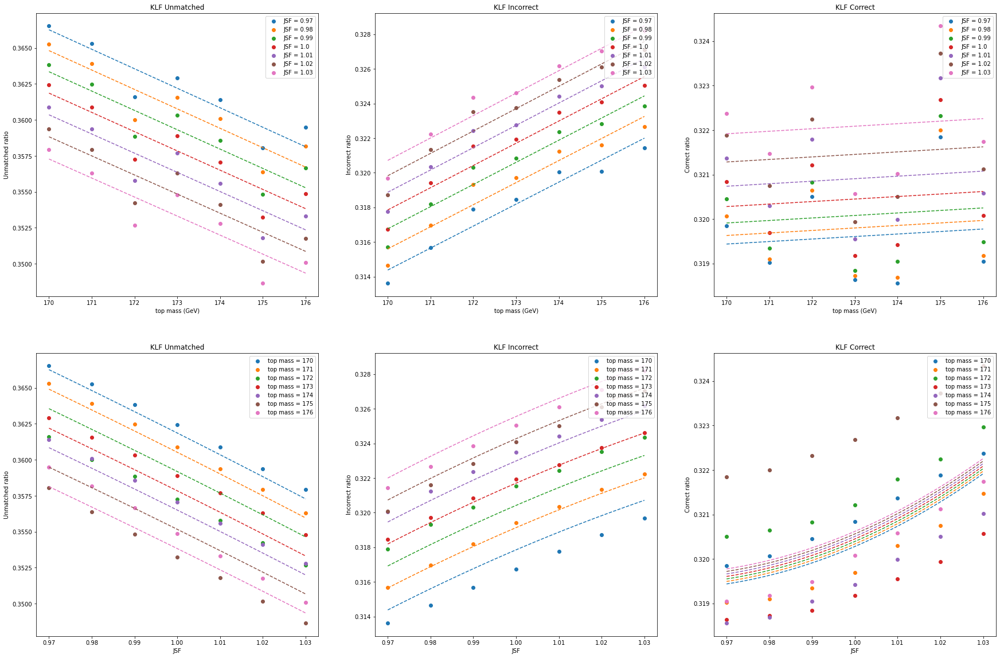

In [7]:
plt.figure(figsize=(30,20))
for state_i in [0, 1, 2]:
    
    plt.subplot(2, 3, state_i+1)
    for JSF in JSF_arr:
        plt.scatter(mass, [ratio_klf_dic[state_i][(m, JSF)] for m in mass], label='JSF = {}'.format(JSF))
        plt.plot(top_mass_dense, linear_parabola([top_mass_dense, np.array([JSF]*1000)], *fpdf_klf_popt[state_i]), '--')
    plt.title('KLF ' + state_labels[state_i])
    plt.xlabel('top mass (GeV)')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')

    plt.subplot(2, 3, state_i+4)
    for m in mass:
        plt.scatter(JSF_arr, [ratio_klf_dic[state_i][(m, JSF)] for JSF in JSF_arr], label='top mass = {}'.format(m))
        plt.plot(JSF_dense, linear_parabola([np.array([m]*1000), JSF_dense], *fpdf_klf_popt[state_i]), '--')
    plt.title('KLF ' + state_labels[state_i])
    plt.xlabel('JSF')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')
plt.show()

In [8]:
ratio_spanet_dic = {i:{} for i in [0, 1, 2]}
for m in mass:
    for JSF in JSF_arr:
        for state_i in [0, 1, 2]:
            ratio = np.count_nonzero(state_spanet_dic[(m, JSF)][np.logical_and(cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)])]==state_i)/len(state_spanet_dic[(m, JSF)][np.logical_and(cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)])])
            ratio_spanet_dic[state_i][(m, JSF)] = ratio

fpdf_spanet_popt = {}
fpdf_spanet_perr = {}
for state_i in [0, 1, 2]:
    popt, pcov = optimize.curve_fit(linear_parabola, np.transpose(list(ratio_spanet_dic[state_i].keys())), [ratio_spanet_dic[state_i][key] for key in ratio_spanet_dic[state_i]], p0 = (0.33, 0, 1, 0, 0), bounds=((0, -0.1, 0, -1, -10), (2, 0.1, 2, 1, 10)))
    perr = np.sqrt(np.diag(pcov))
    fpdf_spanet_popt[state_i] = popt
    fpdf_spanet_perr[state_i] = perr

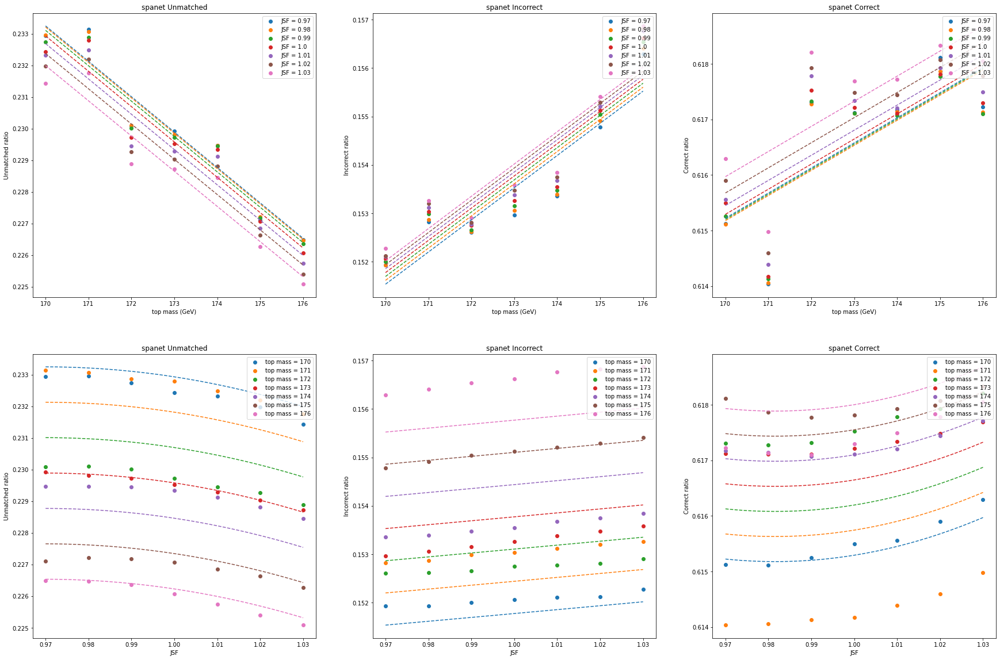

In [9]:
plt.figure(figsize=(30,20))
for state_i in [0, 1, 2]:

    plt.subplot(2, 3, state_i+1)
    for JSF in JSF_arr:
        plt.scatter(mass, [ratio_spanet_dic[state_i][(m, JSF)] for m in mass], label='JSF = {}'.format(JSF))
        plt.plot(top_mass_dense, linear_parabola([top_mass_dense, np.array([JSF]*1000)], *fpdf_spanet_popt[state_i]), '--')
    plt.title('spanet ' + state_labels[state_i])
    plt.xlabel('top mass (GeV)')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')

    plt.subplot(2, 3, state_i+4)
    for m in mass:
        plt.scatter(JSF_arr, [ratio_spanet_dic[state_i][(m, JSF)] for JSF in JSF_arr], label='top mass = {}'.format(m))
        plt.plot(JSF_dense, linear_parabola([np.array([m]*1000), JSF_dense], *fpdf_spanet_popt[state_i]), '--')
    plt.title('spanet ' + state_labels[state_i])
    plt.xlabel('JSF')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')
plt.show()

## PDF fit and PDF parameters fit

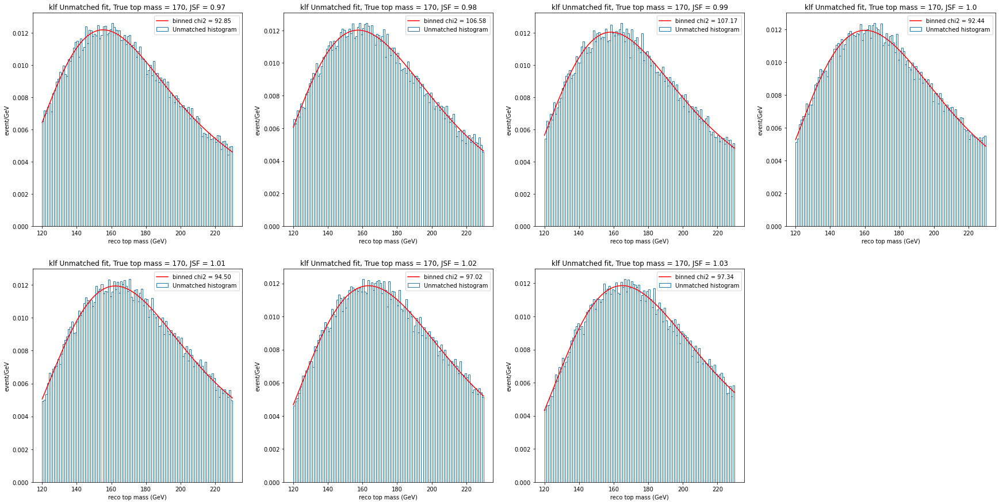

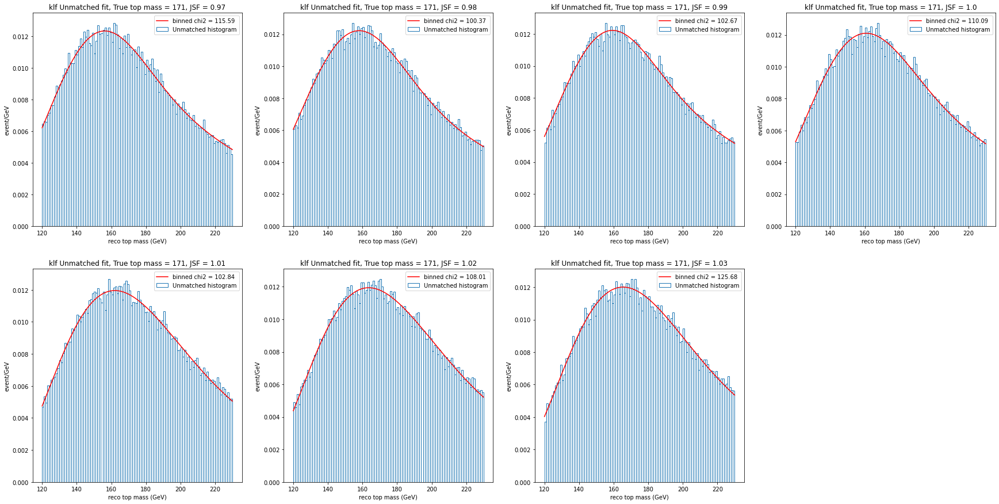

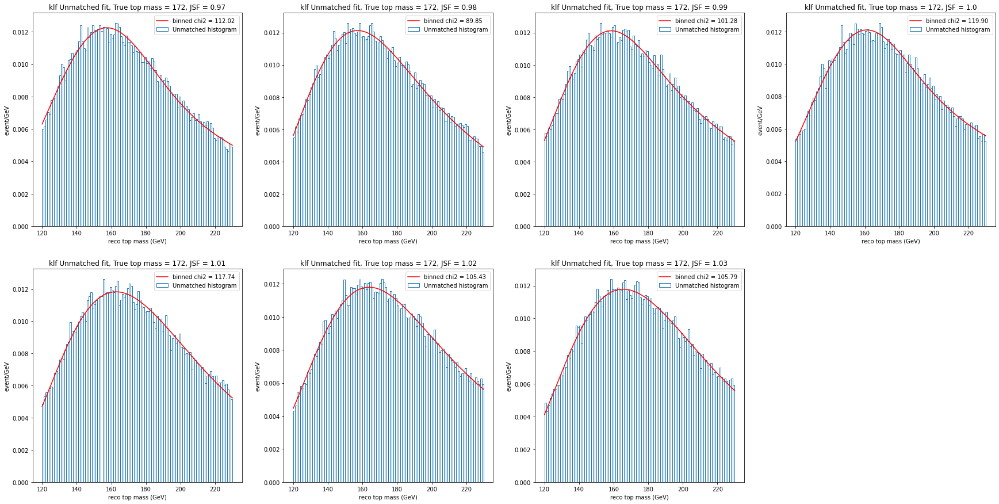

[161.3049763084079, 28.950766275784236, 164.7278082748282, 33.57823217909578, 0.11135710315170584]


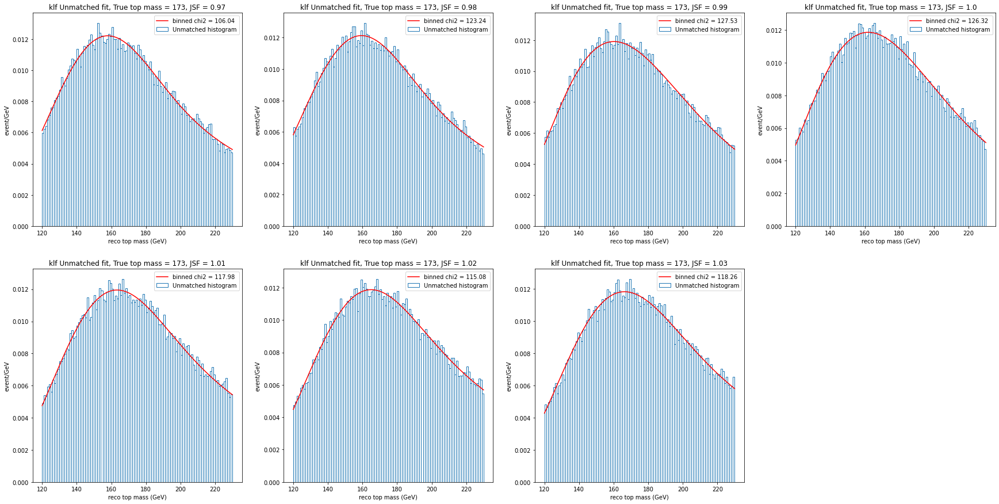

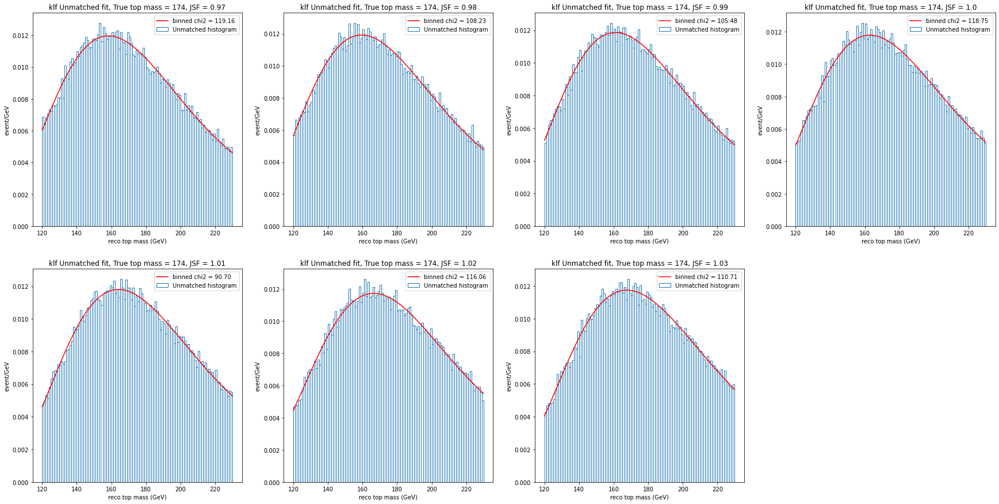

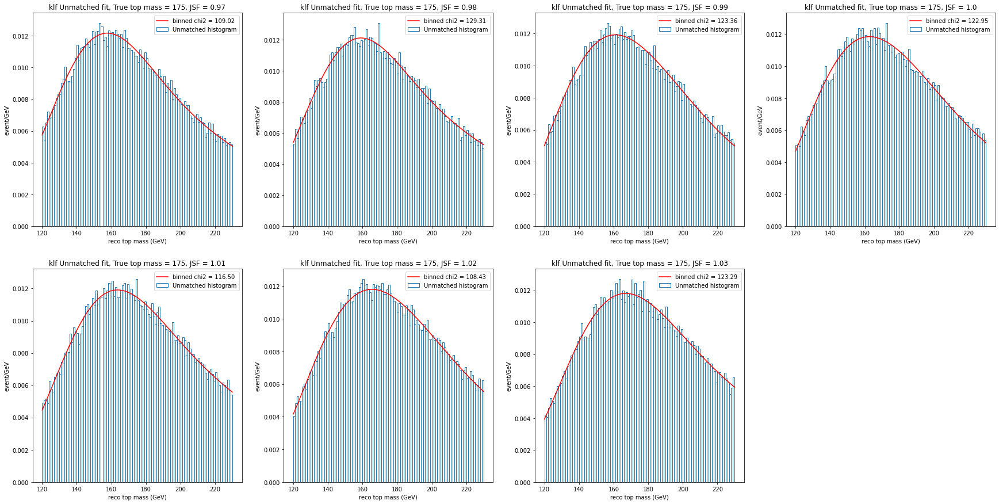

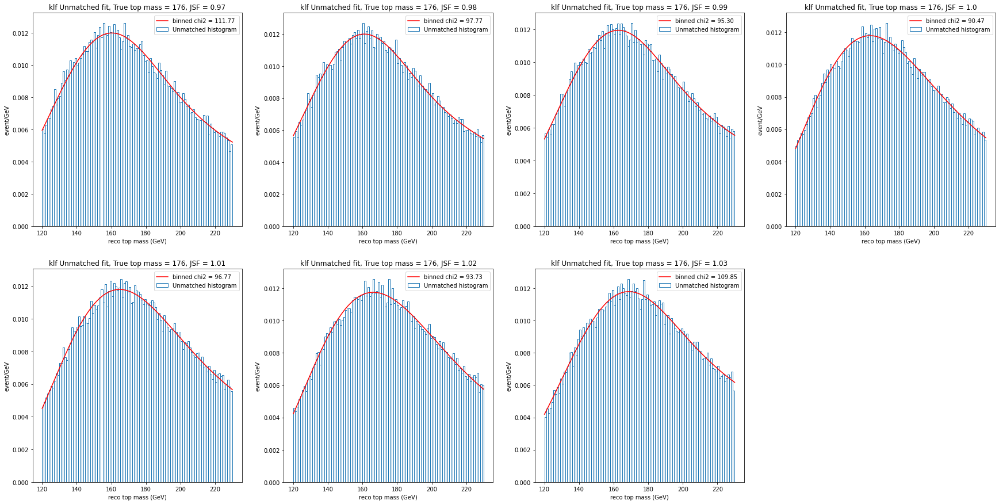

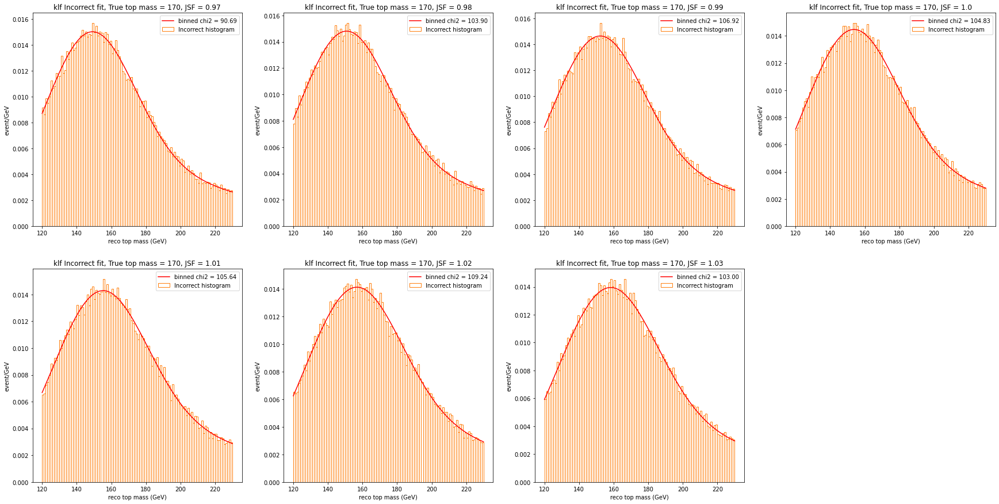

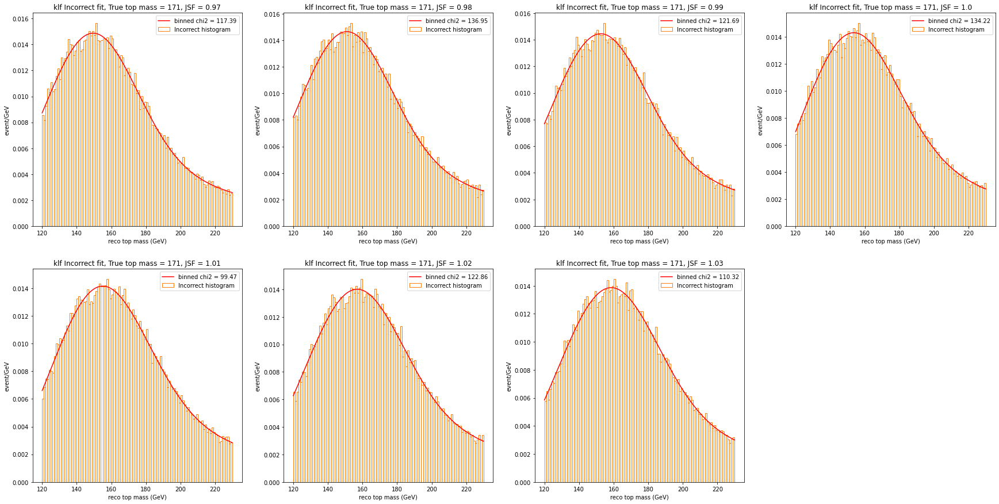

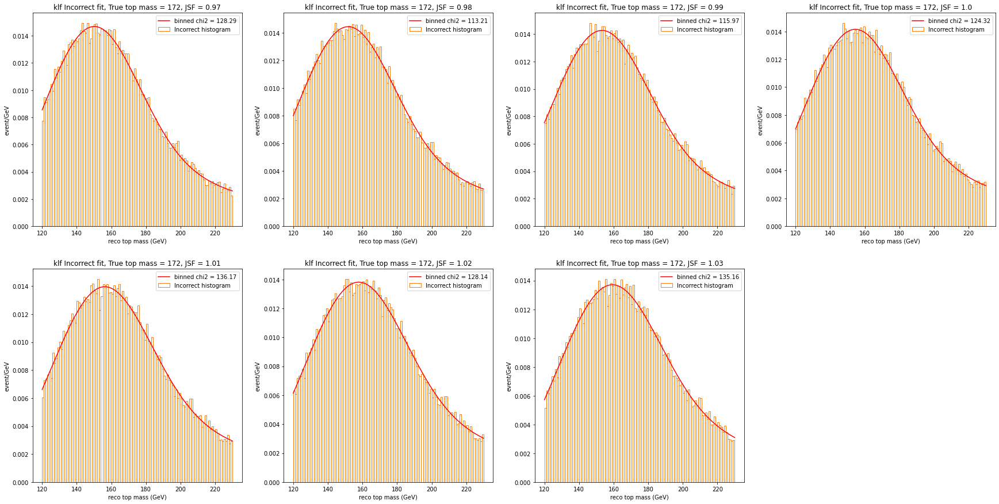

[157.90599174272927, 33.19396107303343, 154.79508701365097, 26.07961721396197, 0.45991448893497855]


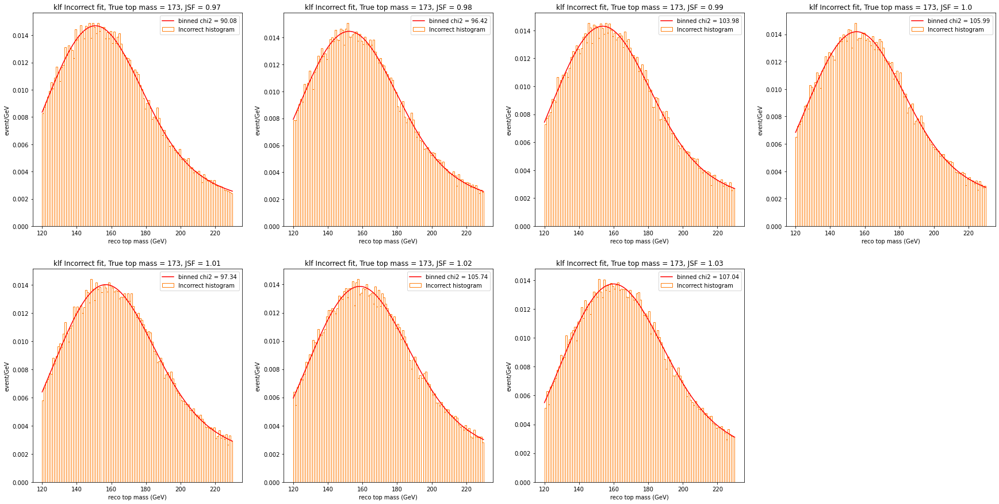

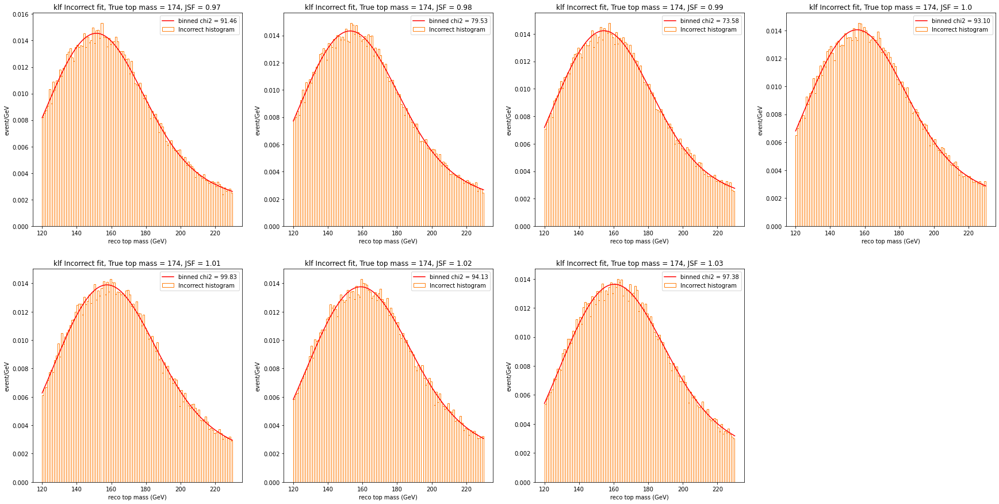

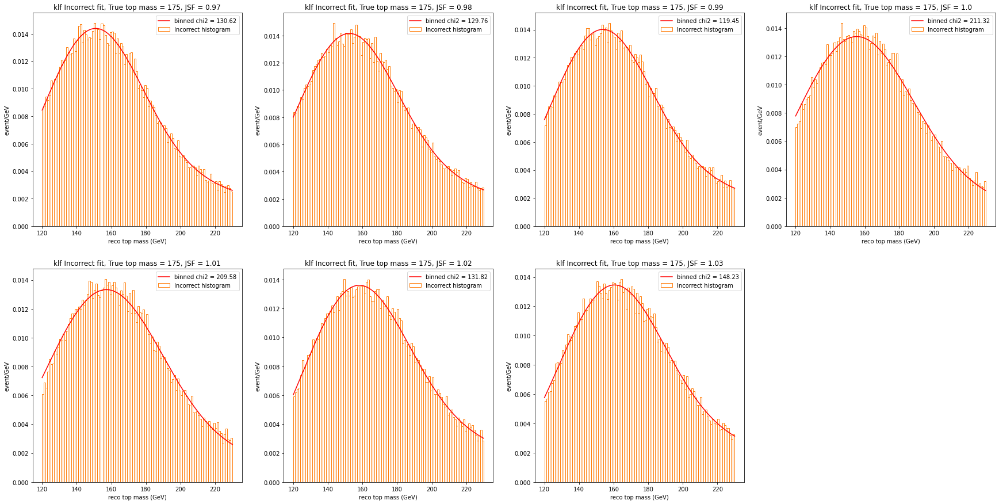

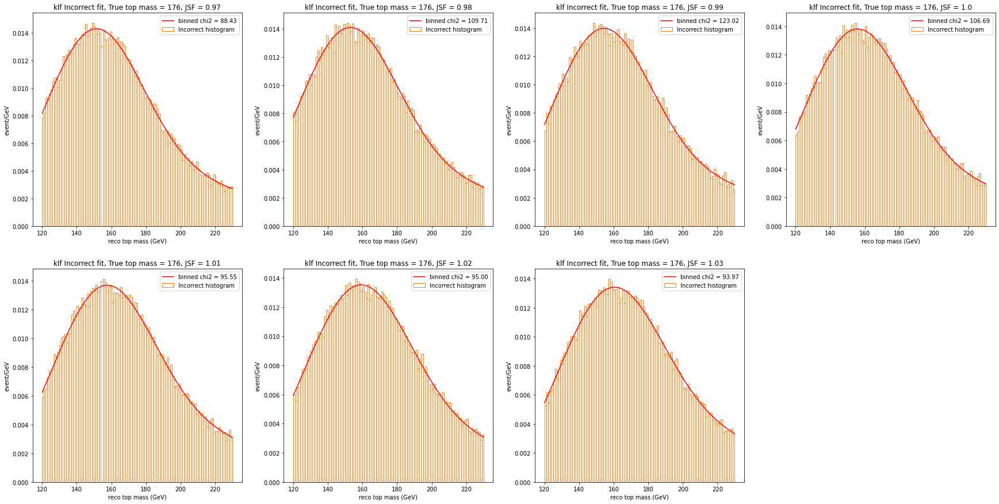

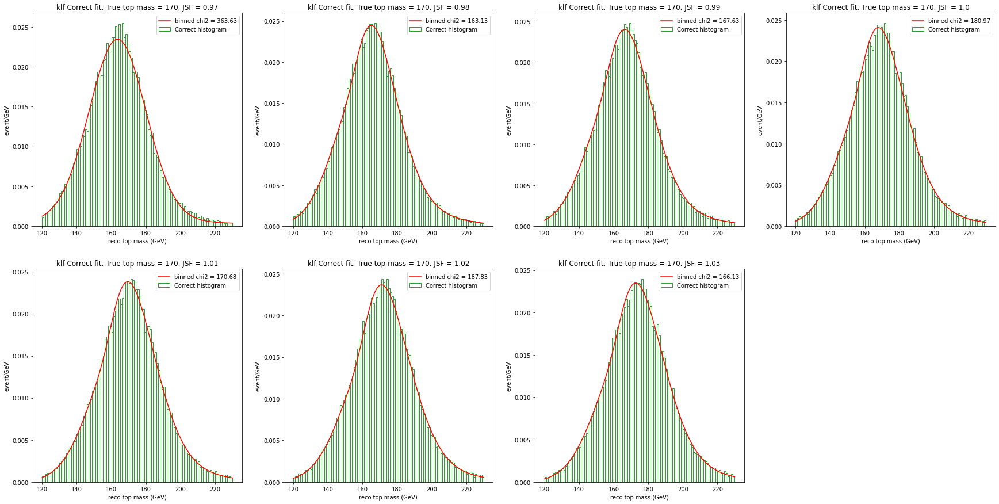

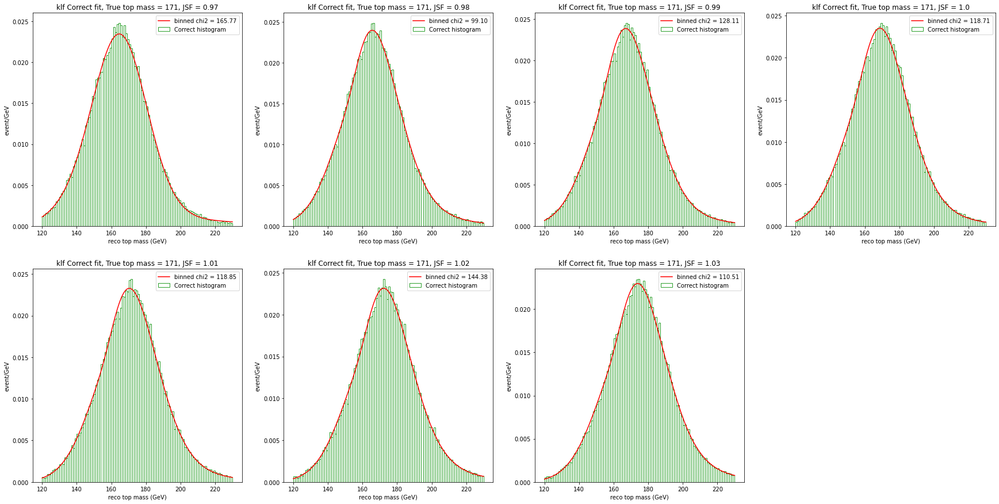

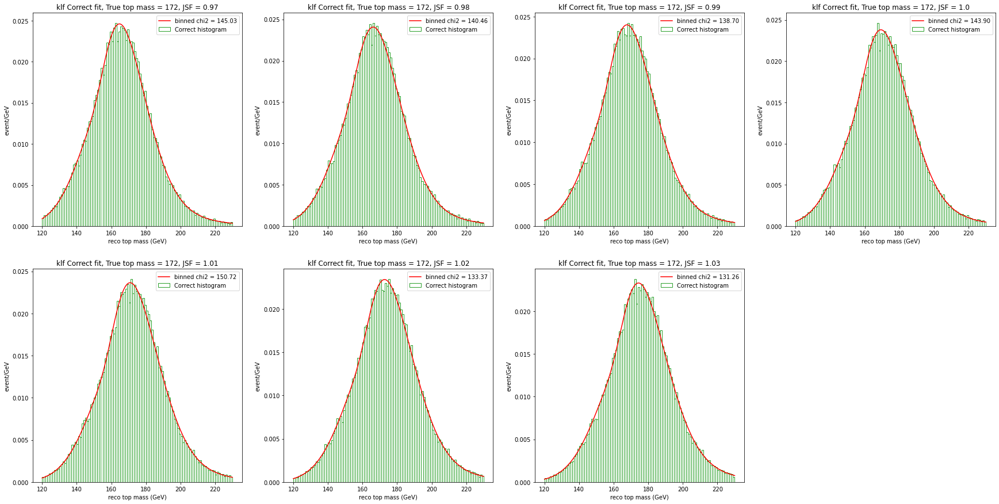

[174.3235603990324, 8.827275209430642, 166.71362804338946, 17.421687958883936, 0.7164316604875945]


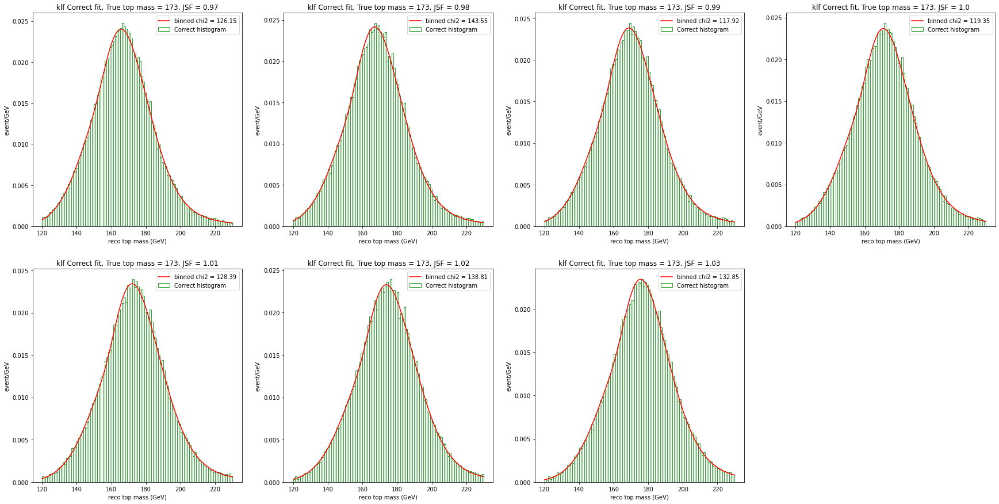

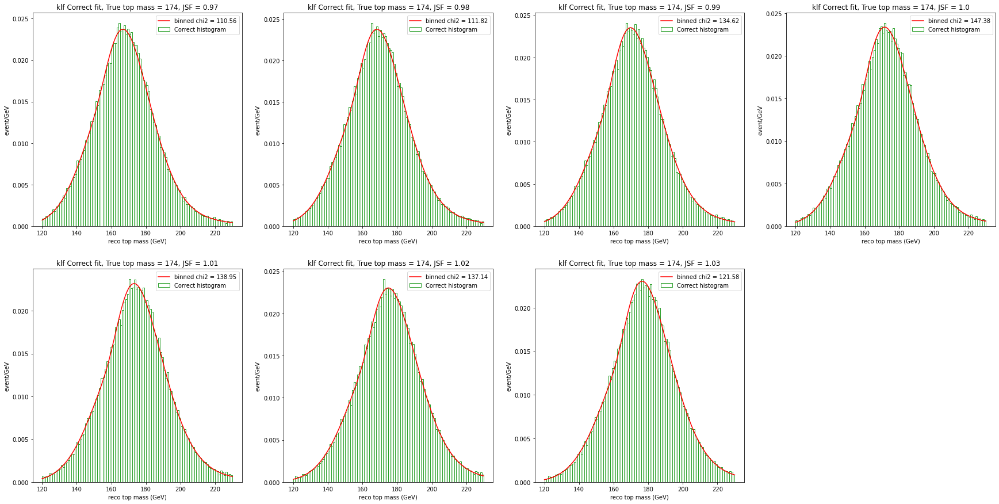

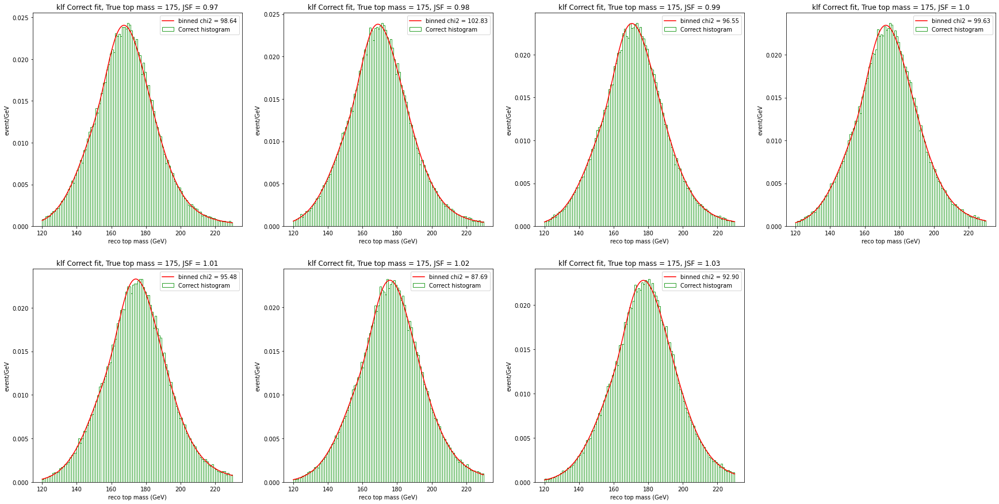

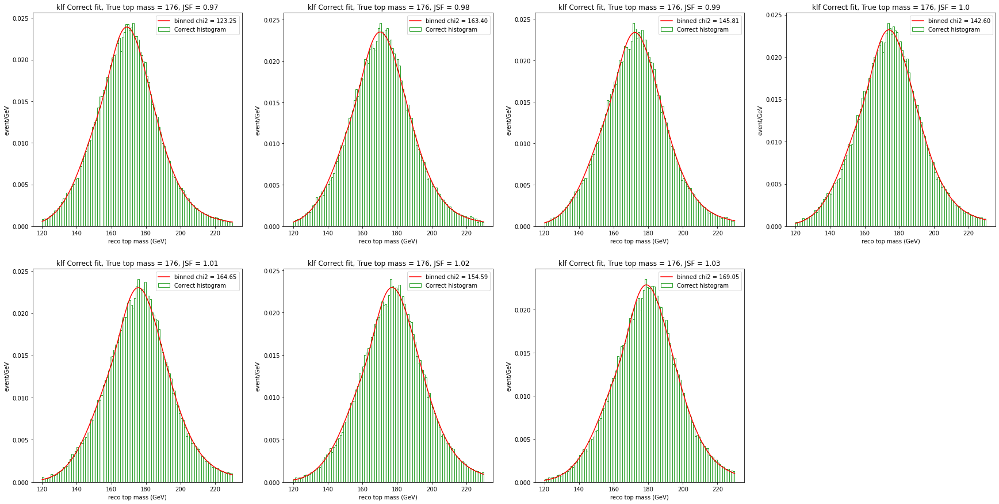

In [71]:
# Fit klfitter reconstructed top mass for every state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)]==state_i))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            minuit = Minuit(fcn_top, 170, 30, 170, 30, 0.5)
            minuit.limits = [(100, 250), (5, 50), (100, 250), (10, 50), (0.1, 0.9)]
            minuit.migrad()
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            if m == 173 and JSF == 1: print(popt)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='binned chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.title('klf {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc='upper right')
        plt.show()

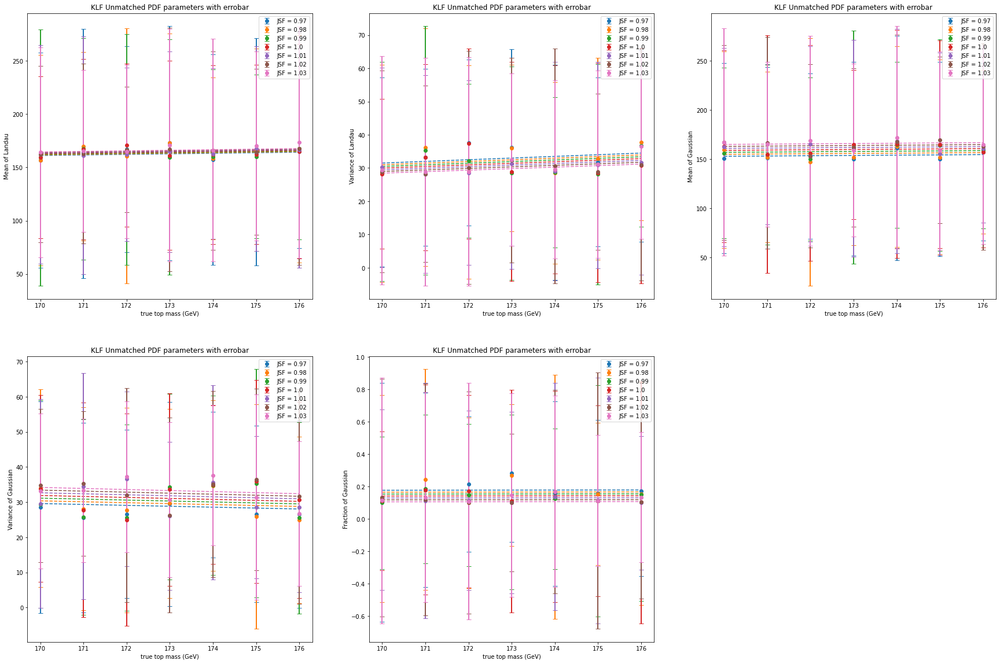

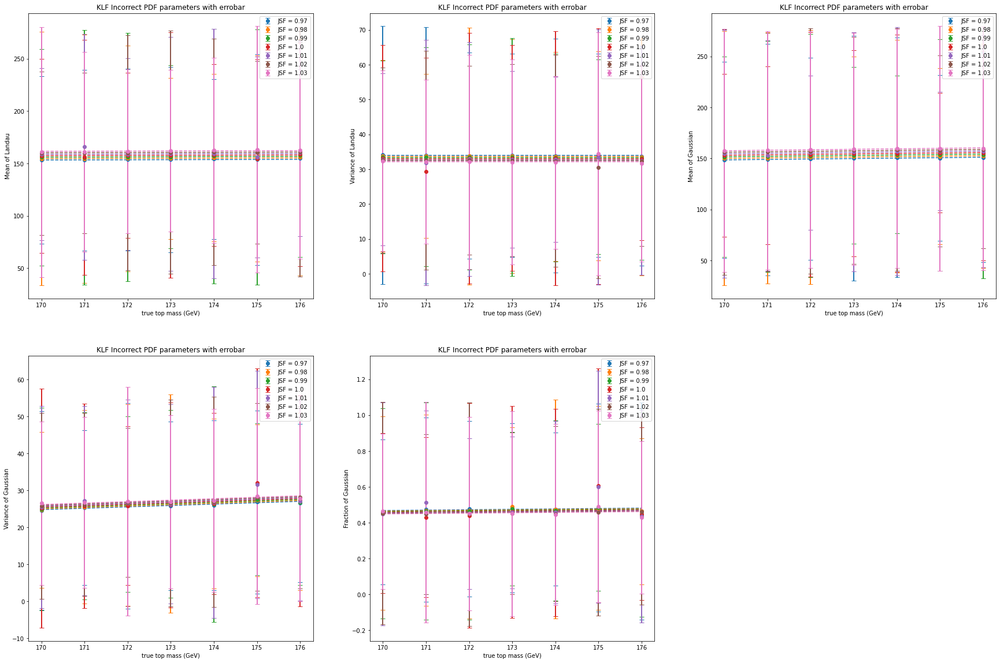

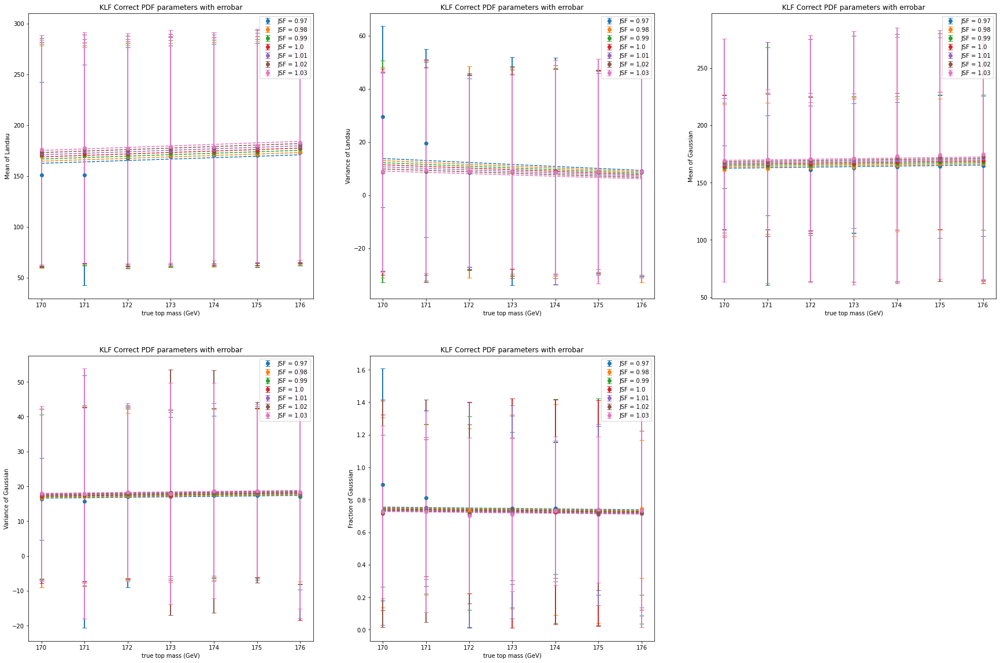

In [11]:
pdf_klf_top_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_klf_top_dic[(state_i, i)] = popt

        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('KLF {} PDF parameters with errobar'.format(state_labels[state_i]))
        plt.xlabel('true top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

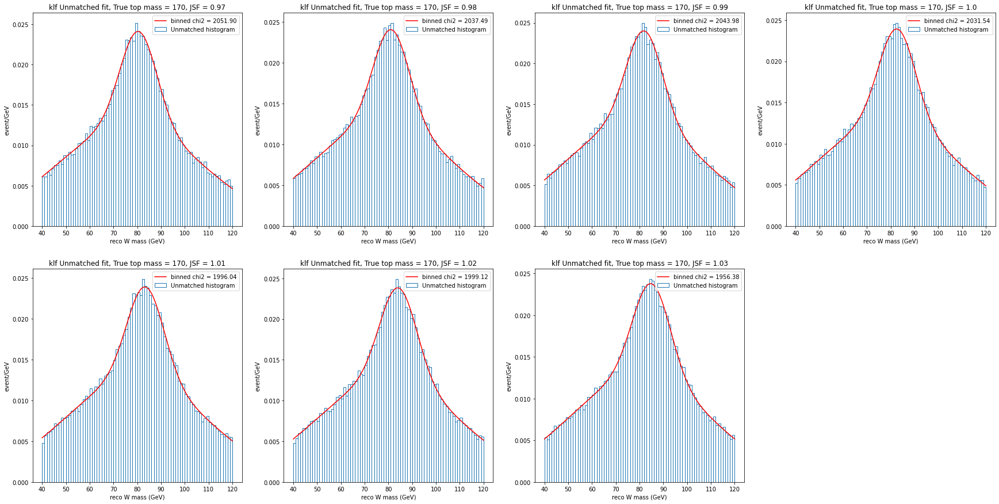

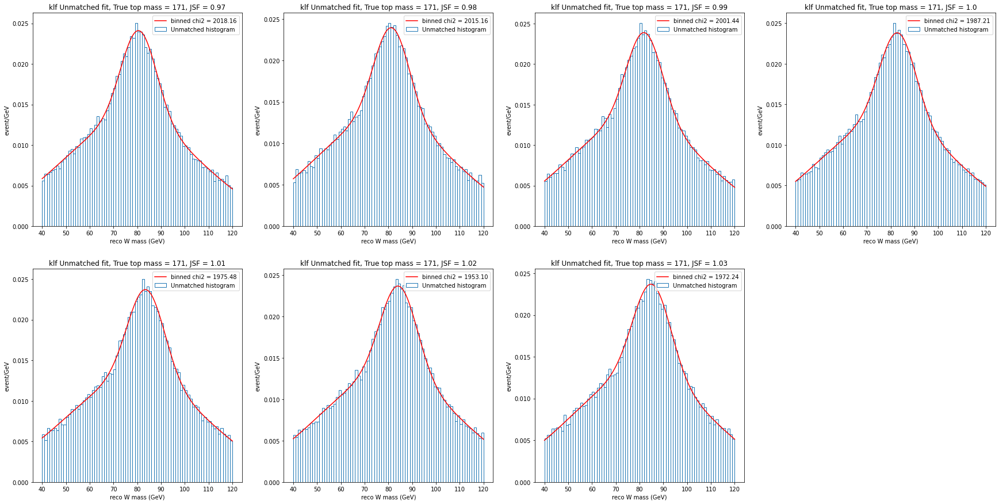

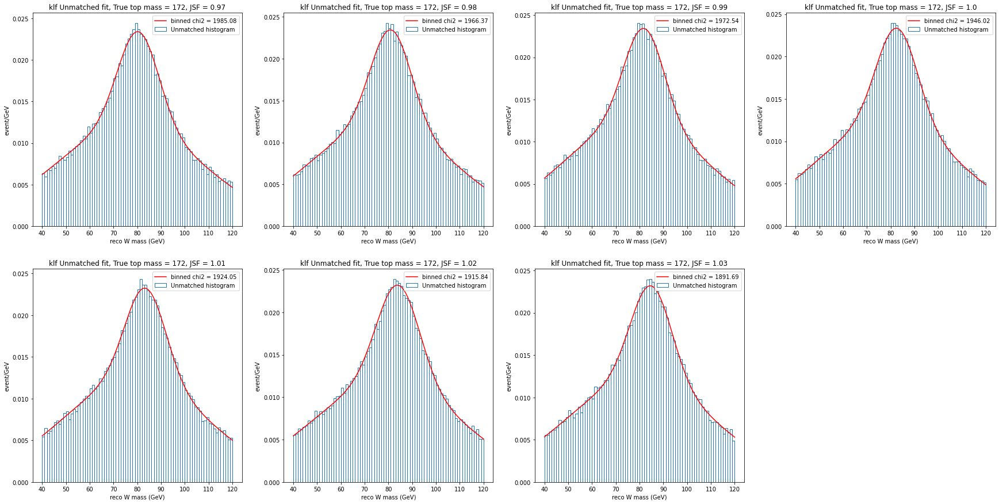

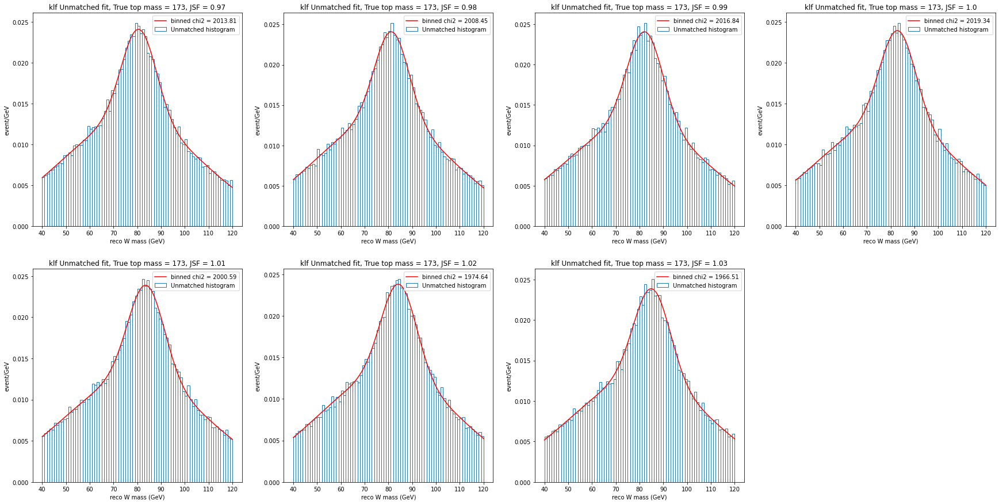

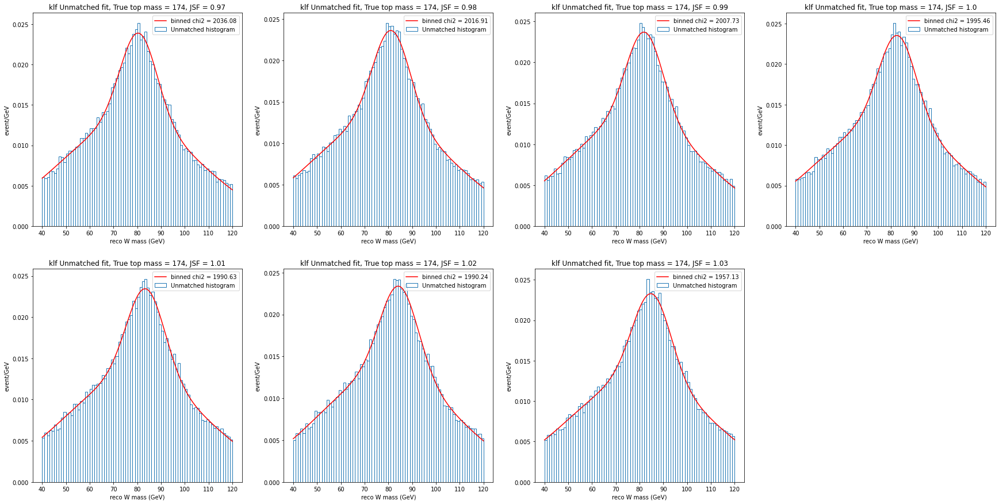

...

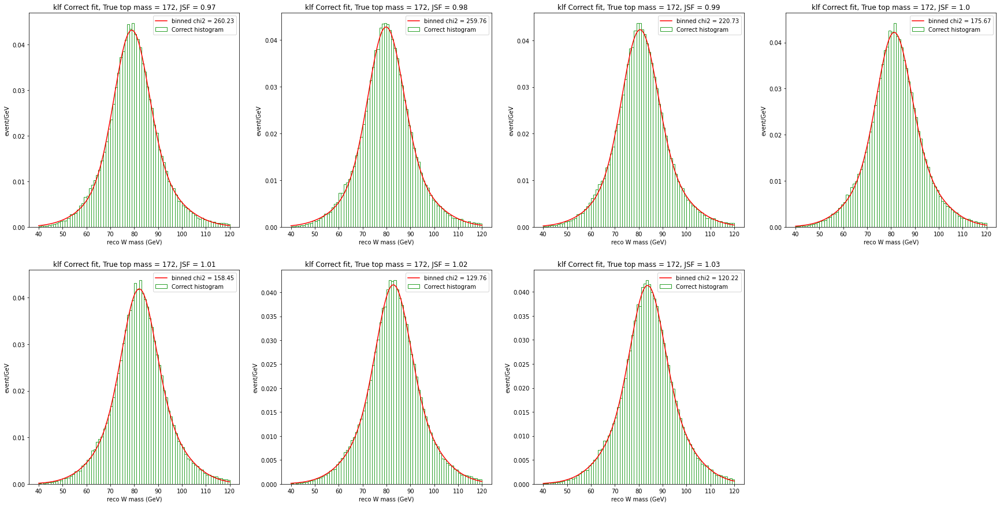

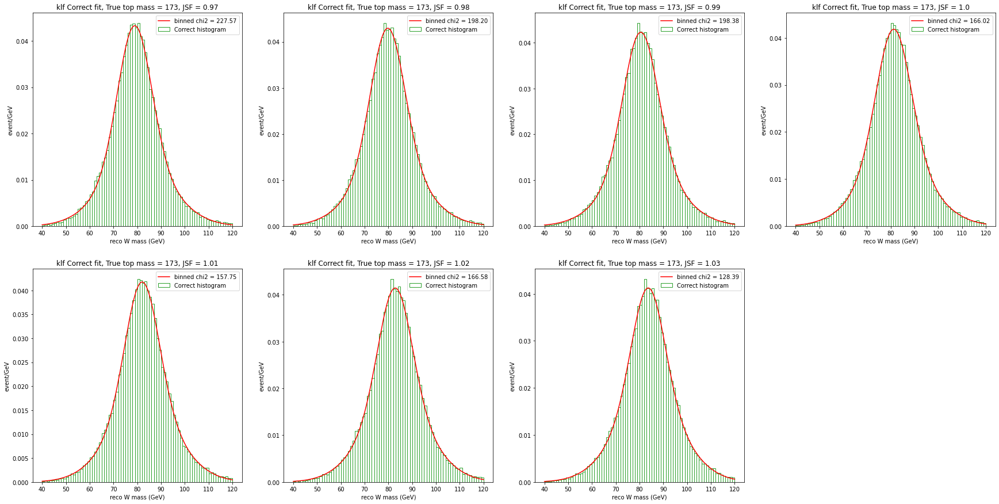

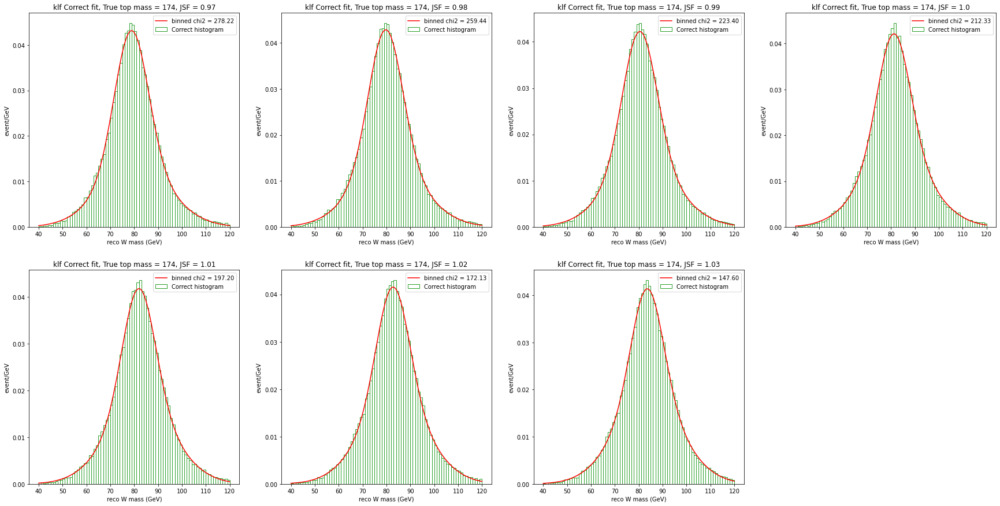

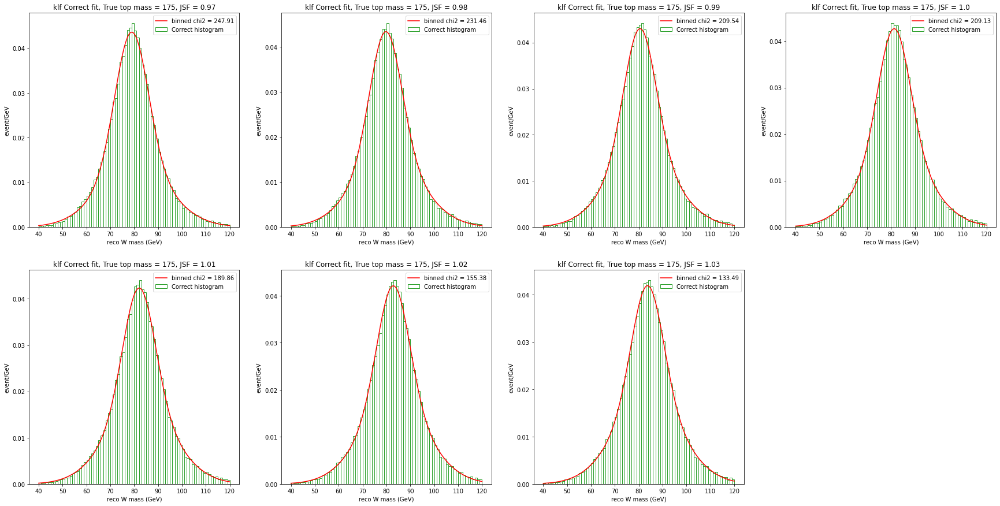

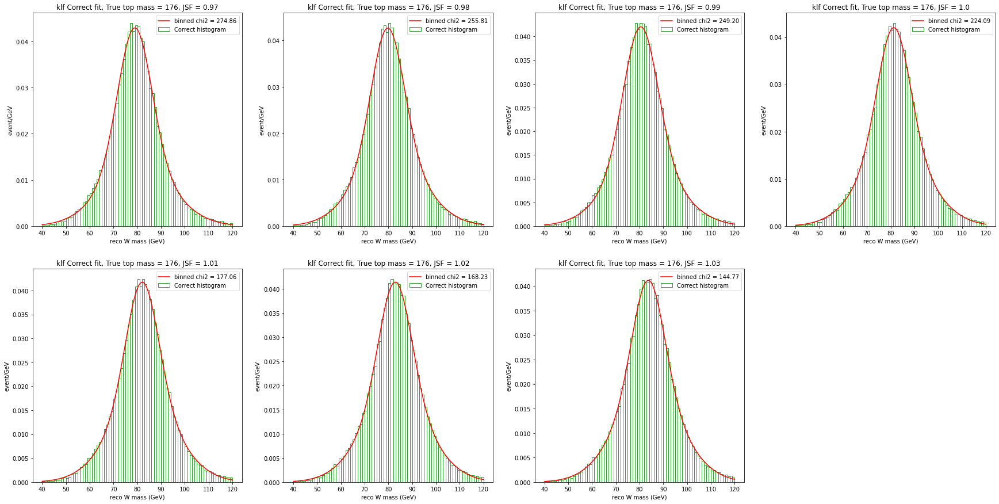

In [12]:
# Fit klfitter reconstucted W mass for every state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)]==state_i))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            minuit = Minuit(fcn_W, 80, 8, 80, 30, 0.5)
            minuit.limits = [(30, 250), (3, 50), (30, 250), (10, 100), (0.1, 0.9)]
            minuit.migrad()
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='binned chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.title('klf {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco W mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc='upper right')
        plt.show()

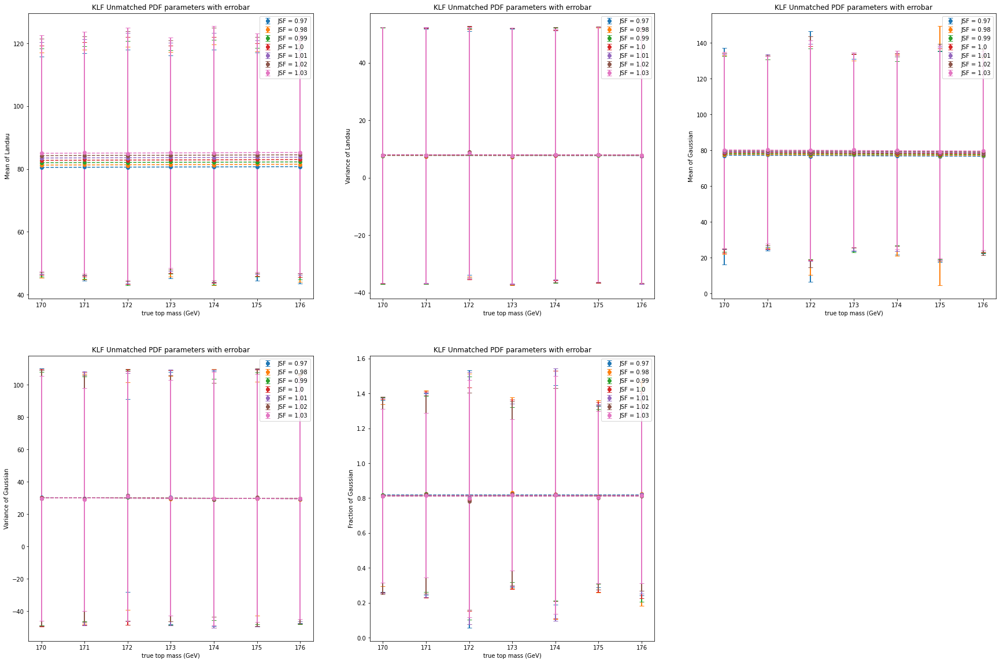

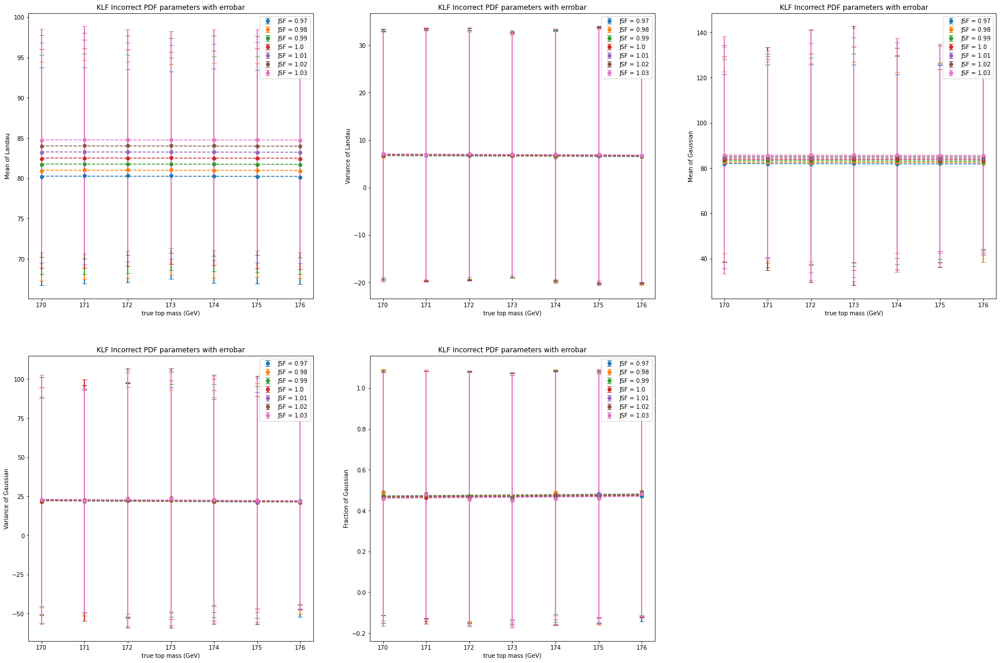

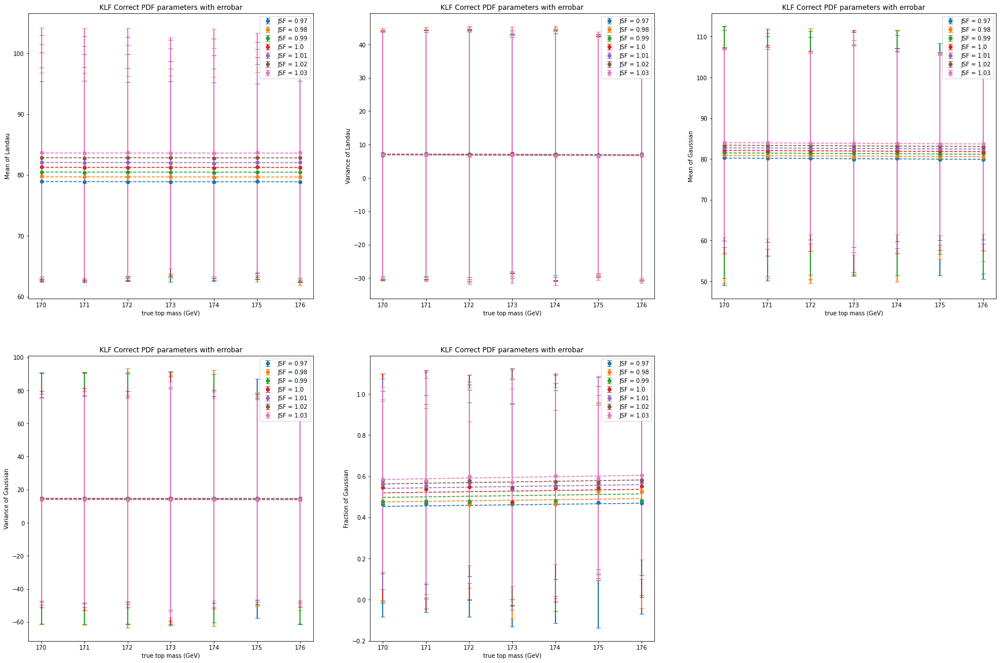

In [13]:
pdf_klf_W_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_klf_W_dic[(state_i, i)] = popt

        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('KLF {} PDF parameters with errobar'.format(state_labels[state_i]))
        plt.xlabel('true top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

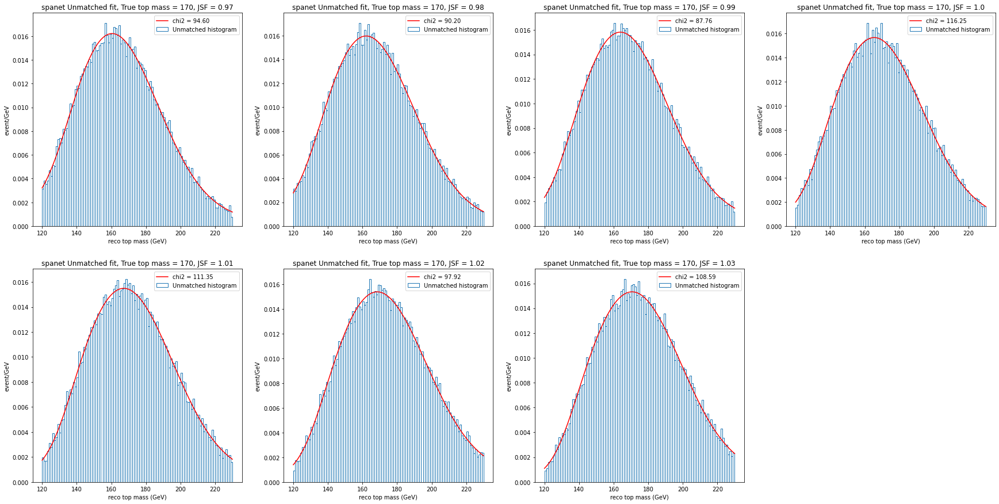

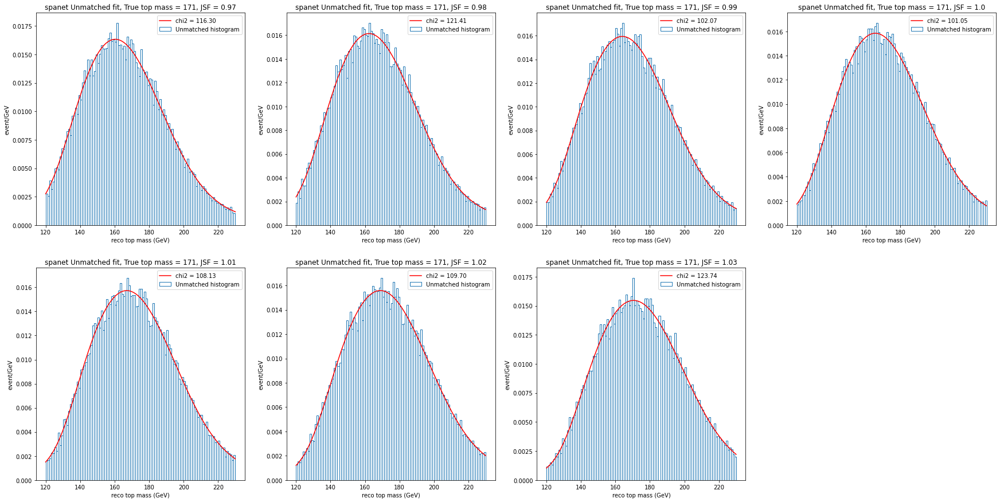

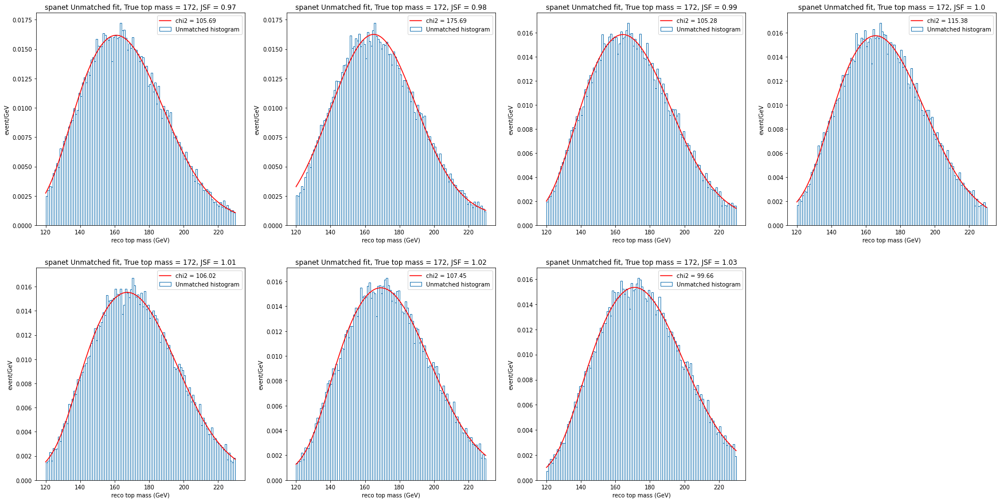

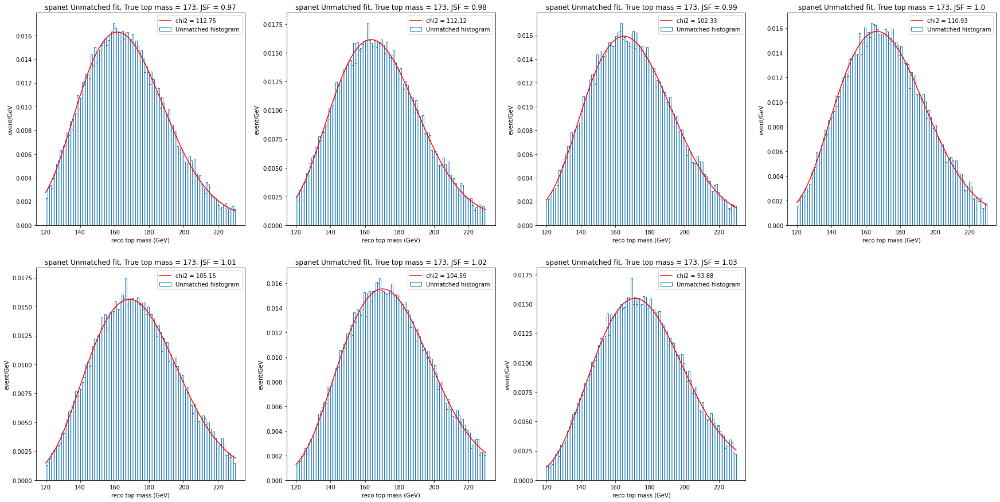

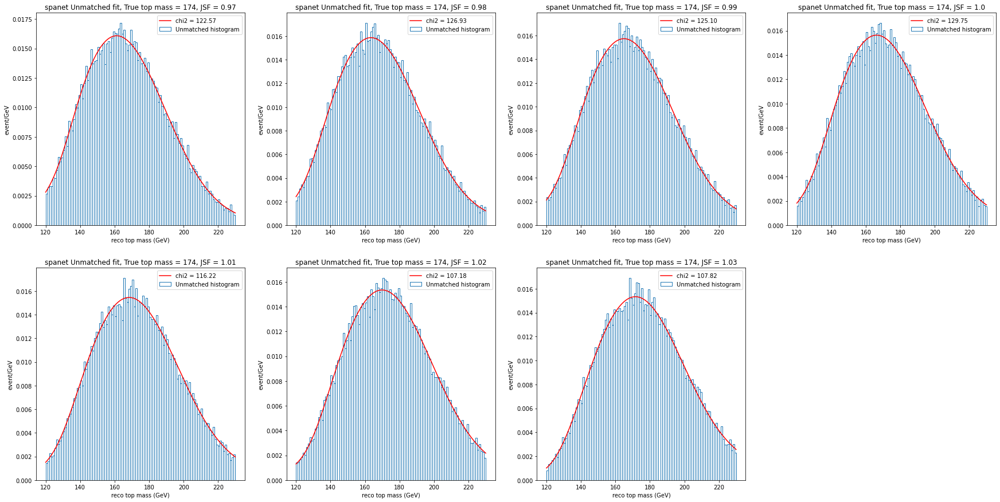

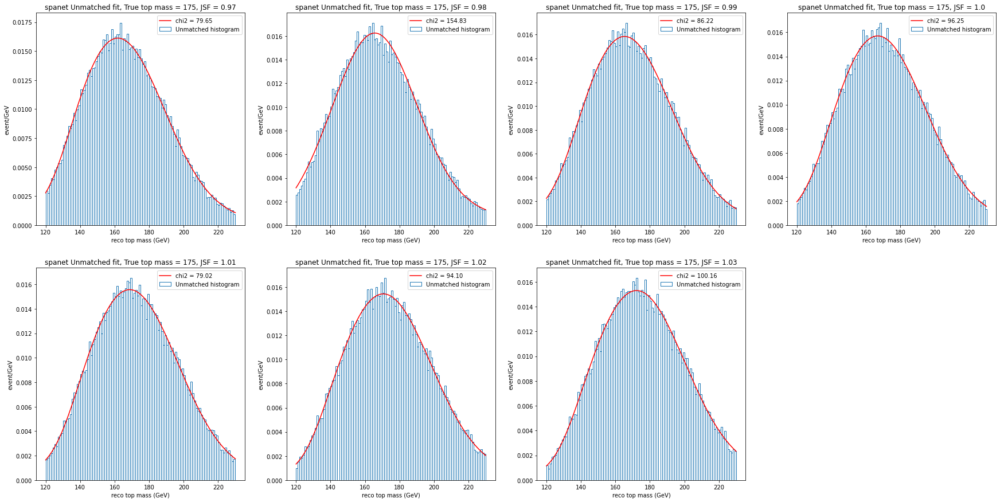

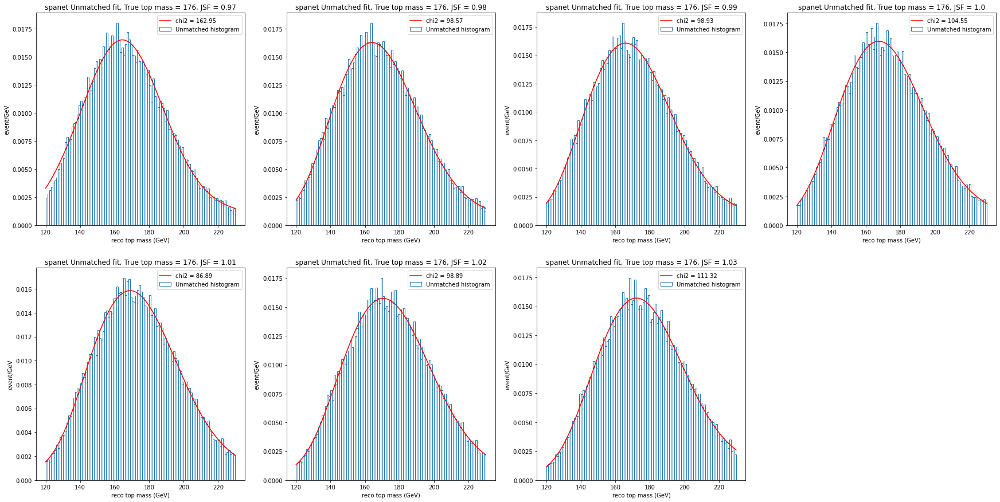

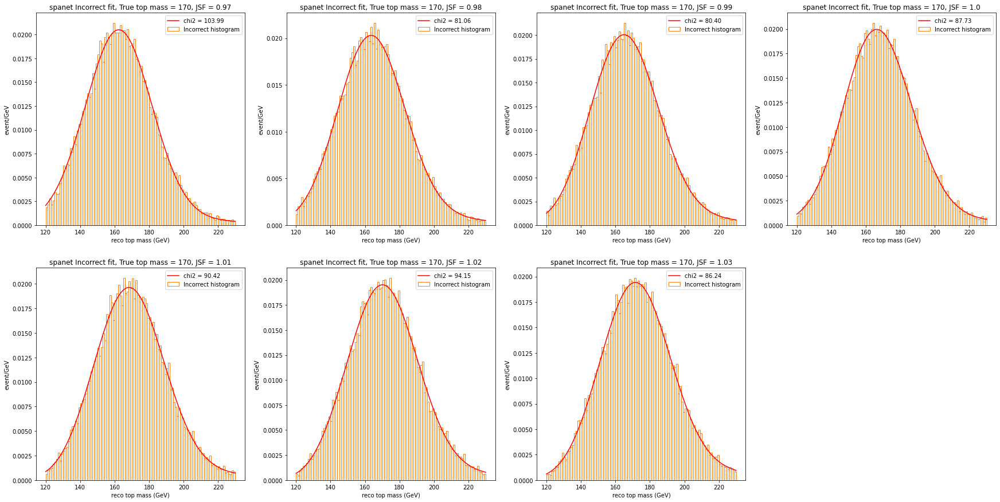

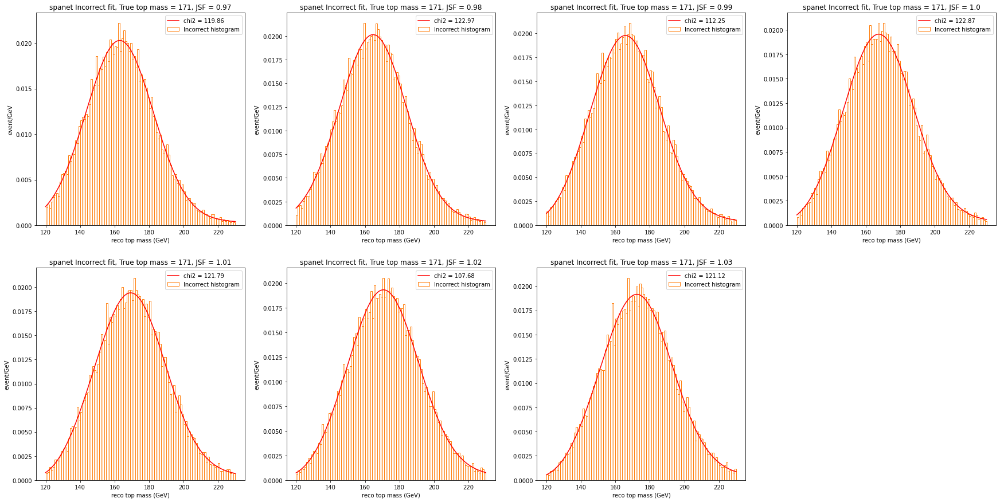

In [ ]:
# Fit spanet reconstructed top mass for every state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            minuit = Minuit(fcn_top, 170, 30, 170, 30, 0.5)
            minuit.limits = [(100, 250), (5, 50), (100, 250), (10, 50), (0.1, 0.9)]
            minuit.migrad(iterate=1000)
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.title('spanet {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
pdf_spanet_top_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_spanet_top_dic[(state_i, i)] = popt
        
        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('SPANET PDF parameters with errobar')
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

In [ ]:
# Fit klfitter reconstucted W mass for every state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            minuit = Minuit(fcn_W, 80, 8, 80, 30, 0.5)
            minuit.limits = [(30, 250), (3, 50), (30, 250), (5, 80), (0.1, 0.9)]
            minuit.migrad()
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='binned chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.title('klf {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco W mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc='upper right')
        plt.show()

In [ ]:
pdf_spanet_W_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_spanet_W_dic[(state_i, i)] = popt
        
        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('SPANET PDF parameters with errobar')
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

In [ ]:
# Fit true reconstructed top mass
fit_popt_dic = {i:{} for i in [2]}
fit_perr_dic = {i:{} for i in [2]}

for state_i in [2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == state_i))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            minuit = Minuit(fcn_top, 170, 30, 170, 30, 0.5)
            minuit.limits = [(100, 250), (5, 50), (100, 250), (10, 50), (0.1, 0.9)]
            minuit.migrad(iterate=1000)
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.title('true fit, true top mass = {}, JSF = {}'.format(m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()


In [ ]:
pdf_true_top_dic = defaultdict(list)
for state_i in [2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_true_top_dic[(state_i, i)] = popt
        
        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('True PDF parameters with errobar')
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

In [ ]:
# Fit true reconstucted W mass
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            minuit = Minuit(fcn_W, 80, 8, 80, 30, 0.5)
            minuit.limits = [(30, 250), (3, 50), (30, 250), (5, 80), (0.1, 0.9)]
            minuit.migrad()
            minuit.minos()
            popt, errors = list(minuit.values), list(minuit.errors)
            fit_popt_dic[state_i][(m, JSF)], fit_perr_dic[state_i][(m, JSF)] = popt, errors
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='binned chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.title('klf {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco W mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc='upper right')
        plt.show()

In [ ]:
pdf_true_W_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_true_W_dic[(state_i, i)] = popt
        
        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('SPANET PDF parameters with errobar')
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

In [ ]:
# Compare the klfitter reconstructed top mass pdf to the original template
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)] == state_i, likeli_klf_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_klf_top_dic[(state_i, j)]) for j in range(5)]
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.title('klf {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
# Compare the klfitter reconstructed W mass pdf to the original template
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)] == state_i, likeli_klf_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_klf_W_dic[(state_i, j)]) for j in range(5)]
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.title('klf {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
# Compare the spanet reconstructed top mass pdf to the original template
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30,15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_spanet_top_dic[(state_i, j)]) for j in range(5)]
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.title('spanet {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
# Compare the spanet reconstructed W mass pdf to the original template
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_spanet_W_dic[(state_i, j)]) for j in range(5)]
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.title('klf {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
# Compare the true reconstructed top mass pdf to the original template
for state_i in [2]:
    for m in mass:
        plt.figure(figsize=(30,15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = reco_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
            hist, _ = np.histogram(fit_target, bins=top_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_true_top_dic[(state_i, j)]) for j in range(5)]
            plt.bar(top_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(top_bins_dense, langau_norm(top_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_top(fit_target, langau_norm(top_bins_mid, *popt))))
            plt.title('true comparison, Top mass = {}, JSF = {}'.format(m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
# Compare the true reconstructed W mass pdf to the original template
for state_i in [2]:
    for m in mass:
        plt.figure(figsize=(30, 15))
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(2, 4, i+1)
            fit_target = W_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
            hist, _ = np.histogram(fit_target, bins=W_bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_true_W_dic[(state_i, j)]) for j in range(5)]
            plt.bar(W_bins_mid, hist, edgecolor=colors[state_i], width=bins_width, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(W_bins_dense, two_gau_norm(W_bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf_W(fit_target, two_gau_norm(W_bins_mid, *popt))))
            plt.title('true comparison, Top mass = {}, JSF = {}'.format(m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [ ]:
def klf_top_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_klf_top_dic[(state_i, j)]) for j in range(5)]
        hist += langau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_klf_popt[state_i])
    return hist

def klf_W_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_klf_W_dic[(state_i, j)]) for j in range(5)]
        hist += two_gau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_klf_popt[state_i])
    return hist

def spanet_top_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_spanet_top_dic[(state_i, j)]) for j in range(5)]
        hist += langau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_spanet_popt[state_i])
    return hist

def spanet_W_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_spanet_W_dic[(state_i, j)]) for j in range(5)]
        hist += two_gau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_spanet_popt[state_i])
    return hist

def true_top_pdf_func(x, m, JSF):
    popt = [linear_linear((m, JSF), *pdf_true_top_dic[(2, j)]) for j in range(5)]
    return langau_norm(x, *popt)

def true_W_pdf_func(x, m, JSF):
    popt = [linear_linear((m, JSF), *pdf_true_W_dic[(2, j)]) for j in range(5)]
    return two_gau_norm(x, *popt)

def chi2_klf_arr_func(m, JSF):
    return -2*np.sum(n1*np.log(klf_top_pdf_func(top_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n1) -2*np.sum(n2*np.log(klf_W_pdf_func(W_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n2)

def chi2_spanet_arr_func(m, JSF):
    return -2*np.sum(n1*np.log(spanet_top_pdf_func(top_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n1) -2*np.sum(n2*np.log(spanet_W_pdf_func(W_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n2)

def chi2_true_arr_func(m, JSF):
    return -2*np.sum(n1*np.log(true_top_pdf_func(top_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n1) -2*np.sum(n2*np.log(true_W_pdf_func(W_bins_mid, m, JSF)*sum(n1)*bins_width))+sum(n2)

In [ ]:
# # Compare the klfitter pdf to the original histogram
# for m in mass:
#     plt.figure(figsize=(30, 15))
#     for i, JSF in enumerate(JSF_arr):
#         plt.subplot(2, 4, i+1)
#         fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]        
#         h, tot = [0]*(len(bins)-1), len(fit_target)
#         for state_i in [0, 1, 2]:
#             hist, _ = np.histogram(reco_klf_dic[(m, JSF)][np.logical_and.reduce((state_klf_dic[(m, JSF)] == state_i, cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))], bins=bins)
#             plt.bar(bins_mid, hist/tot/bins_w, bottom=h, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
#             h += hist/tot/bins_w

#         plt.plot(bins_dense, combine_klf_pdf_func(bins_dense, m, JSF), c='r')
#         plt.title('klfitter combined pdf comparison, Top mass = {}, JSF = {}'.format(m, JSF))
#         plt.xlabel('reco top mass (GeV)')
#         plt.ylabel('event/GeV')
#         plt.legend(loc='upper right')
#     plt.show()

In [ ]:
# # Compare the spanet pdf to the original histogram
# for m in mass:
#     plt.figure(figsize=(30, 15))
#     for i, JSF in enumerate(JSF_arr):
#         plt.subplot(2, 4, i+1)
#         fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
#         h, tot = [0]*(len(bins)-1), len(fit_target)
#         for state_i in [0, 1, 2]:
#             hist, _ = np.histogram(reco_spanet_dic[(m, JSF)][np.logical_and.reduce((state_spanet_dic[(m, JSF)] == state_i, cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))], bins=bins)
#             plt.bar(bins_mid, hist/tot/bins_w, bottom=h, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
#             h += hist/tot/bins_w

#         plt.plot(bins_dense, combine_spanet_pdf_func(bins_dense, m, JSF), c='r')
#         plt.title('spanet combined pdf comparison, Top mass = {}, JSF = {}'.format(m, JSF))
#         plt.xlabel('reco top mass (GeV)')
#         plt.ylabel('event/GeV')
#         plt.legend(loc='upper right')
#     plt.show()

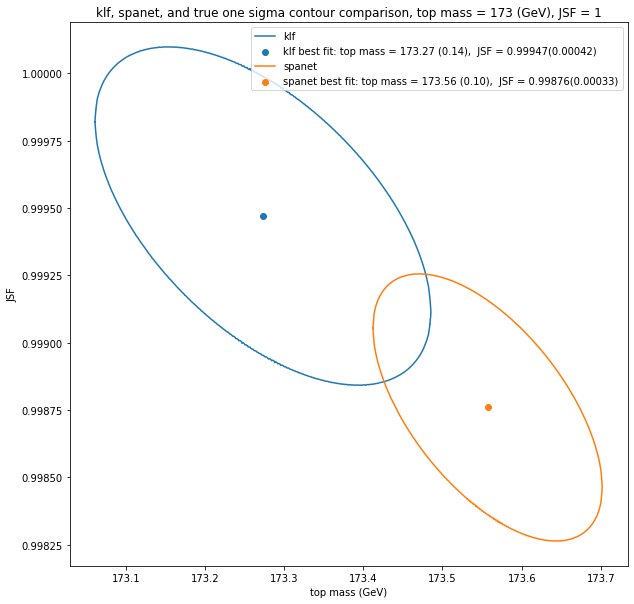

In [64]:
plt.figure(figsize=(10, 10))
m, JSF = 173, 1

reco_klf_top = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n1 = np.histogram(reco_klf_top, bins=top_bins)[0]
reco_klf_W = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n2 = np.histogram(reco_klf_W, bins=W_bins)[0]

minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='klf')
plt.scatter(minuit.values[0], minuit.values[1], label='klf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

reco_spanet_top = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n1 = np.histogram(reco_spanet_top, bins=top_bins)[0]
reco_spanet_W = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n2 = np.histogram(reco_spanet_W, bins=W_bins)[0]

minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='spanet')
plt.scatter(minuit.values[0], minuit.values[1], label='spanet best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

reco_true_top = reco_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
n1 = np.histogram(reco_true_top, bins=top_bins)[0]
reco_true_W = W_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
n2 = np.histogram(reco_true_W, bins=W_bins)[0]

minuit = Minuit(chi2_true_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='true')
plt.scatter(minuit.values[0], minuit.values[1], label='true best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

plt.title('klf, spanet, and true one sigma contour comparison, top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend(loc = 'upper right')
plt.show()

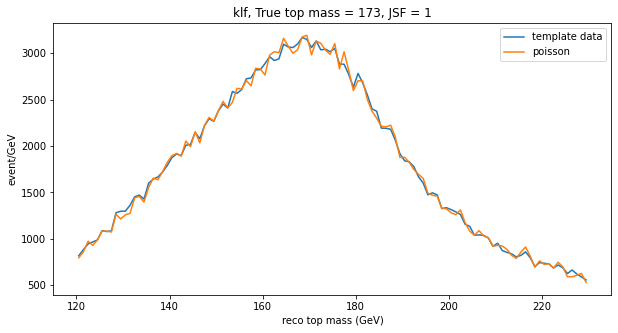

In [65]:
m, JSF = 173, 1
plt.figure(figsize=(10, 5))
reco_klf_top = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
sudo_klf_top = np.histogram(reco_klf_top, bins=top_bins)[0]
n1_arr = np.random.poisson(sudo_klf_top, size=(1, len(sudo_klf_top)))[0]
plt.plot(top_bins_mid, sudo_klf_top, label='template data')
plt.plot(top_bins_mid, n1_arr, label='poisson')
plt.title('klf, True top mass = {}, JSF = {}'.format(m, JSF))
plt.xlabel('reco top mass (GeV)')
plt.ylabel('event/GeV')
plt.legend(loc = 'upper right')
plt.show()

In [42]:
#Sudo experiment for KLFitter top mass
sudo_klf_top_mean_dic = {}
sudo_klf_top_std_dic = {}
sudo_klf_JSF_mean_dic = {}
sudo_klf_JSF_std_dic = {}

for m in mass:
    for JSF in JSF_arr:
        reco_klf_top = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
        reco_klf_W = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
        sudo_klf_top = np.histogram(reco_klf_top, bins=top_bins)[0]
        sudo_klf_W = np.histogram(reco_klf_W, bins=W_bins)[0]
        n1_arr = np.random.poisson(sudo_klf_top, size=(sudo_event, len(sudo_klf_top)))
        n2_arr = np.random.poisson(sudo_klf_W, size=(sudo_event, len(sudo_klf_W)))
        mean, std = [], []
        for i in tqdm(range(sudo_event)):
            n1, n2 = n1_arr[i], n2_arr[i]
            minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
            minuit.limits = [[166, 180],[0.94,1.07]]
            minuit.migrad()
            minuit.minos()
            mean.append(list(minuit.values))
            std.append(list(minuit.errors))
        top_mean, JSF_mean = np.transpose(mean)
        top_std, JSF_std = np.transpose(std)
        sudo_klf_top_mean_dic[(m, JSF)] = top_mean
        sudo_klf_top_std_dic[(m, JSF)] = top_std
        sudo_klf_JSF_mean_dic[(m, JSF)] = JSF_mean
        sudo_klf_JSF_std_dic[(m, JSF)] = JSF_std

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 64/100 [00:29<00:16,  2.17it/s]/tmp/ipykernel_579/1916793149.py:9: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f)/integrate.quad(langau, top_bins_min, top_bins_max, args=(lan_loc, lan_scale, gau_loc, gau_scale, f))[0]
/tmp/ipykernel_579/1916793149.py:18: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return two_gau(x, gau_loc1, gau_scale1, gau_loc2, gau_scale2, f)/integrate.quad(two_gau, W_bins_min, W_bins_max, args=(gau_loc1, gau_scale1, gau_loc2, gau_scale2, f))[0]
100%|████████████████████████████████████████████████████████

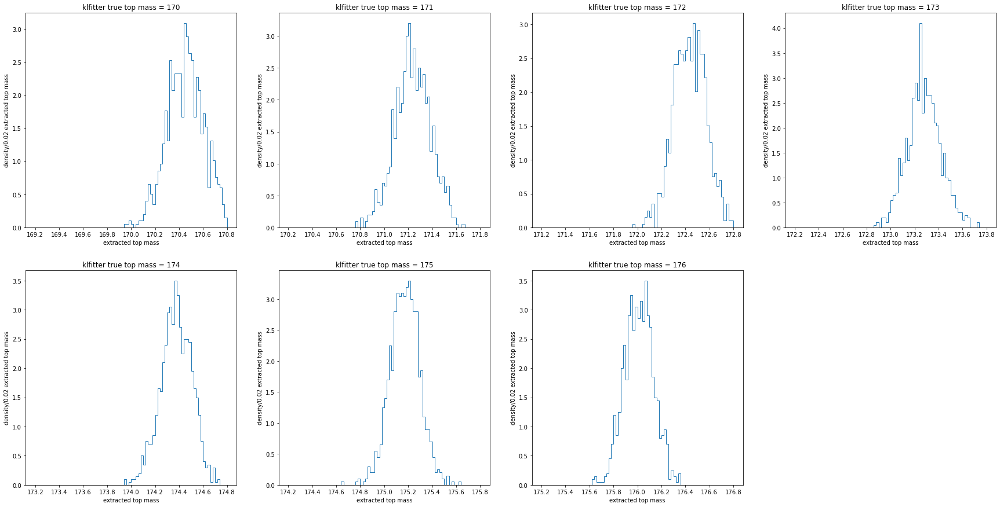

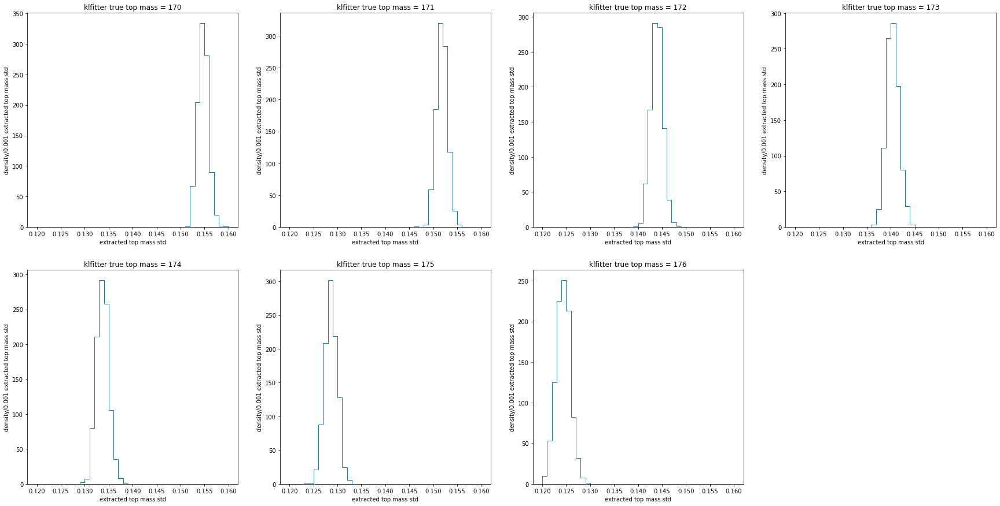

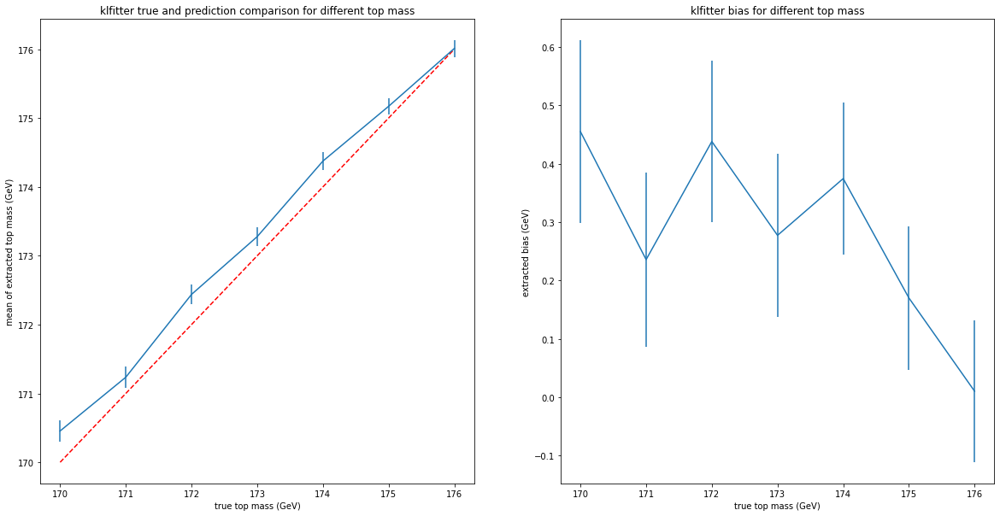

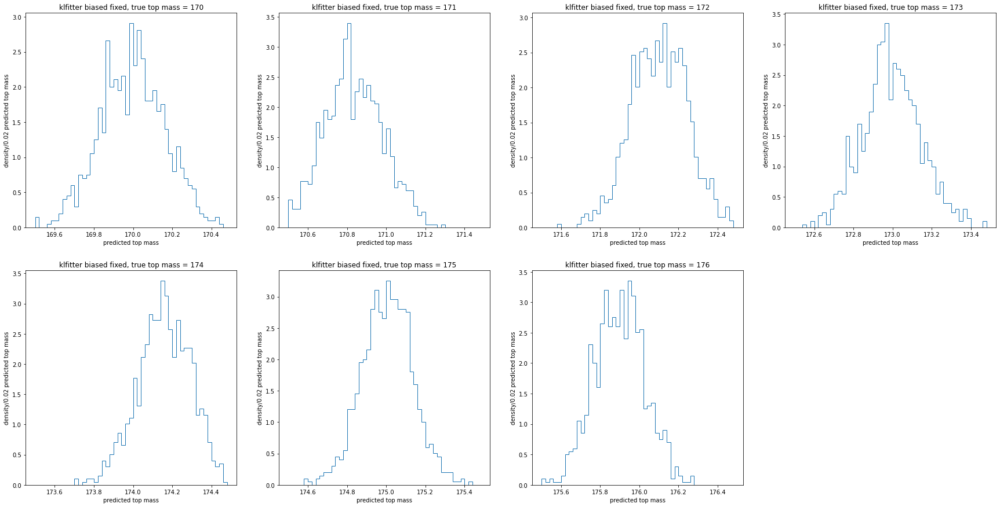

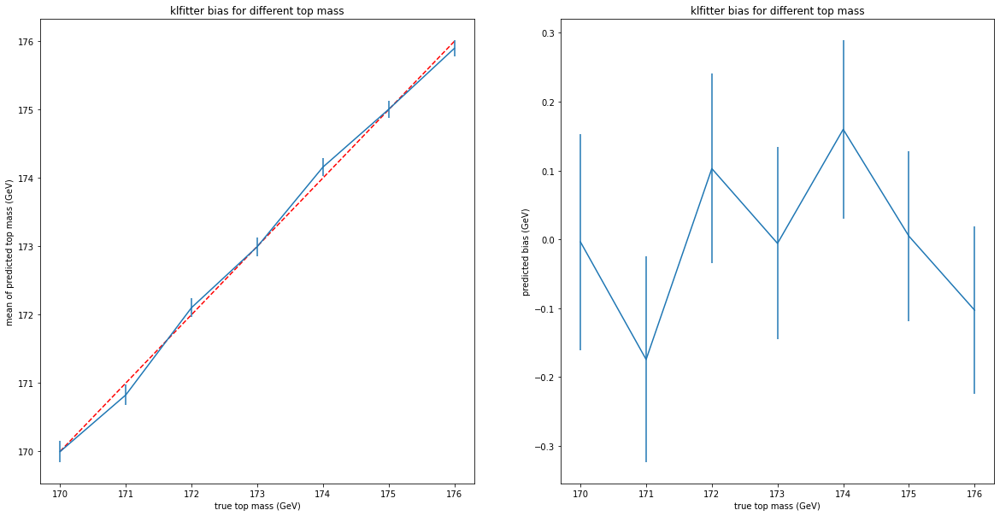

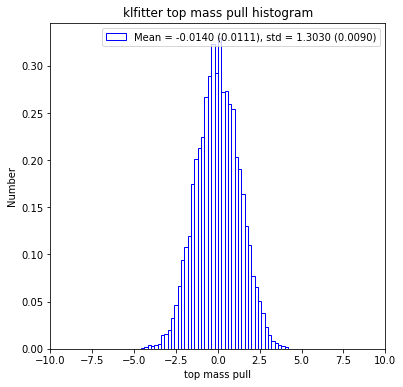

In [46]:
# Plots for klfitter top mass
JSF = 1
plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_klf_top_mean_dic[(m, JSF)], bins=np.arange(m-0.8, m+0.8, 0.02), density=True, histtype='step')
    plt.title('klfitter true top mass = {}'.format(m))
    plt.xlabel('extracted top mass')
    plt.ylabel('density/0.02 extracted top mass')
plt.show()

plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_klf_top_std_dic[(m, JSF)], bins=np.arange(0.12, 0.16, 0.001), density=True, histtype='step')
    plt.title('klfitter true top mass = {}'.format(m))
    plt.xlabel('extracted top mass std')
    plt.ylabel('density/0.001 extracted top mass std')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(mass, mass, 'r--')
plt.errorbar(mass, [np.mean(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass], yerr=[np.std(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('klfitter true and prediction comparison for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('mean of extracted top mass (GeV)')
plt.subplot(1, 2, 2)
plt.errorbar(mass, [np.mean(sudo_klf_top_mean_dic[(m, JSF)])-m for m in mass], yerr=[np.std(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('klfitter bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('extracted bias (GeV)')
plt.show()

klf_top_popt, _ = optimize.curve_fit(linear, mass, [np.mean(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass], sigma=[np.std(sudo_klf_top_mean_dic[(m, JSF)])/np.sqrt(sudo_event) for m in mass], method="lm")
def predicted_klf_top_func(extracted_top): return (np.array(extracted_top) - klf_top_popt[1])/klf_top_popt[0]

plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    bins_top = np.arange(m-0.5, m+0.5, 0.02)
    plt.hist(predicted_klf_top_func(sudo_klf_top_mean_dic[(m, JSF)]), bins=bins_top, density=True, histtype='step')
    plt.title('klfitter biased fixed, true top mass = {}'.format(m))
    plt.xlabel('predicted top mass')
    plt.ylabel('density/0.02 predicted top mass')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(mass, mass, 'r--')
plt.errorbar(mass, [np.mean(predicted_klf_top_func(sudo_klf_top_mean_dic[(m, JSF)])) for m in mass], yerr=[np.std(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('klfitter bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('mean of predicted top mass (GeV)')
plt.subplot(1, 2, 2)
plt.errorbar(mass, [np.mean(predicted_klf_top_func(sudo_klf_top_mean_dic[(m, JSF)]))-m for m in mass], yerr=[np.std(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('klfitter bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('predicted bias (GeV)')
plt.show()

plt.figure(figsize = (6, 6))
klf_top_pull = [(predicted_klf_top_func(sudo_klf_top_mean_dic[(m, JSF)])-m)/sudo_klf_top_std_dic[(m, JSF)] for m in mass]
hist, bin_edges = np.histogram(klf_top_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
klf_top_pull_mean, klf_top_pull_mean_std, klf_top_pull_sigma, klf_top_pull_sigma_std = popt[0], perr[0], popt[1], perr[1]
plt.title('klfitter top mass pull histogram')
plt.xlim(-10, 10)
plt.xlabel('top mass pull')
plt.ylabel('Number')
plt.legend(loc='upper right')
plt.show()

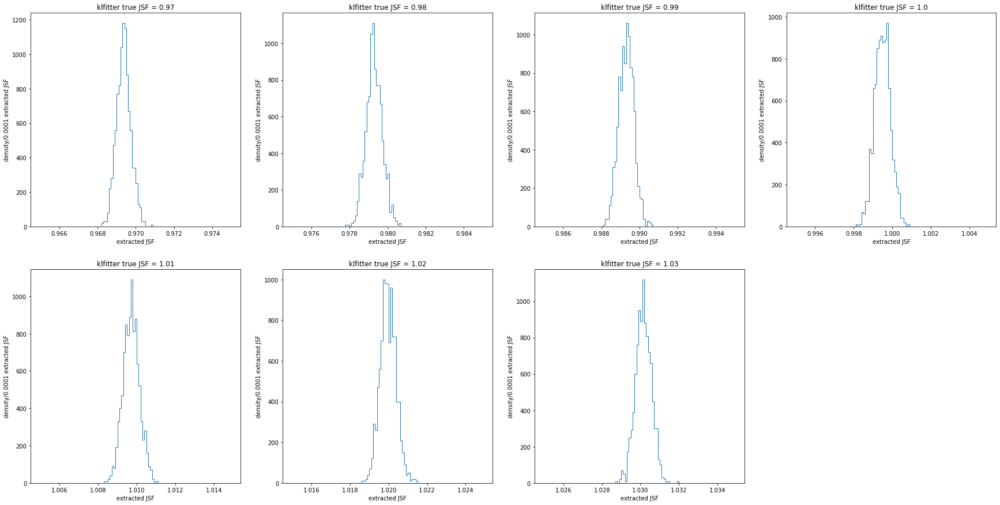

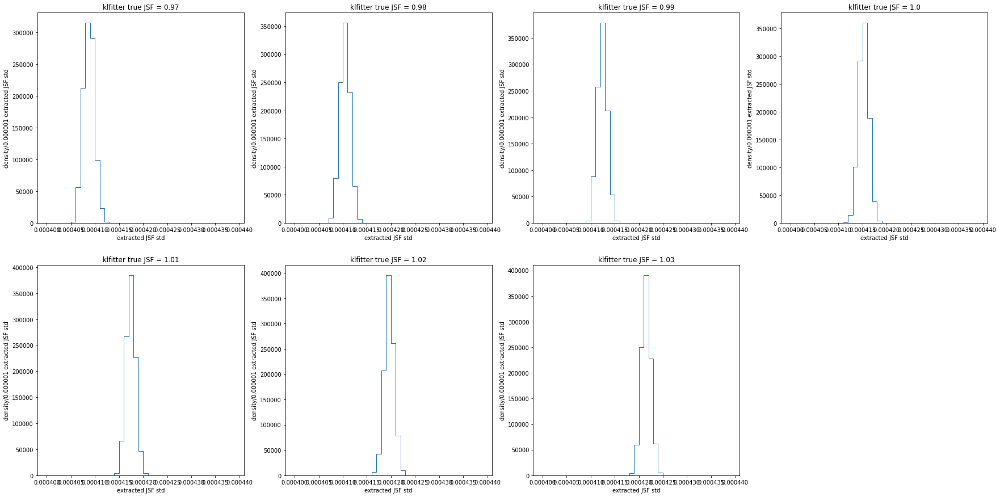

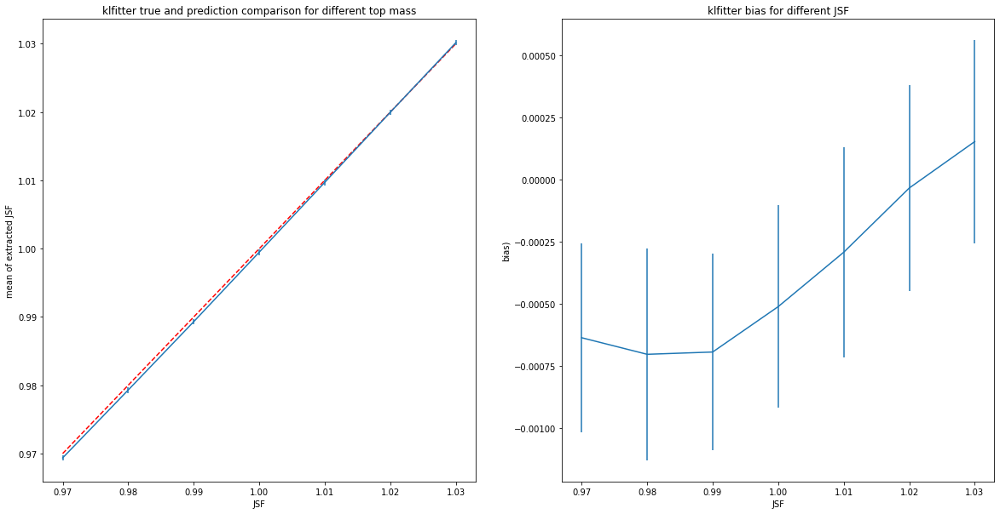

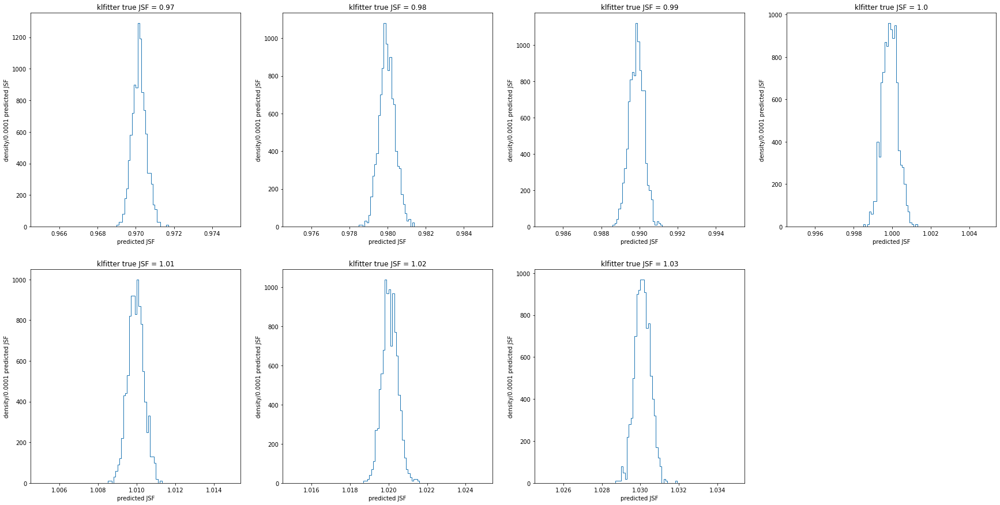

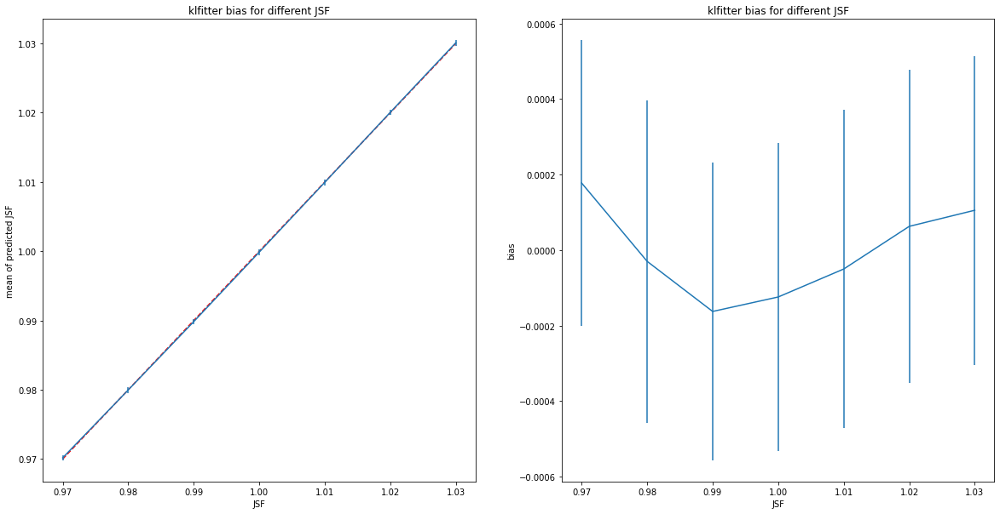

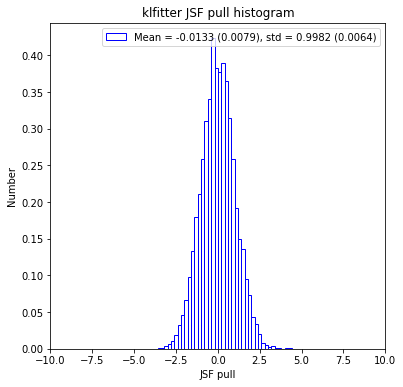

In [40]:
# Plots for klfitter JSF
m = 173
plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_klf_JSF_mean_dic[(m, JSF)], bins=np.arange(JSF-0.005, JSF+0.005, 0.0001), density=True, histtype='step')
    plt.title('klfitter true JSF = {}'.format(JSF))
    plt.xlabel('extracted JSF')
    plt.ylabel('density/0.0001 extracted JSF')
plt.show()

plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_klf_JSF_std_dic[(m, JSF)], bins=np.arange(0.00040, 0.00044, 0.000001), density=True, histtype='step')
    plt.title('klfitter true JSF = {}'.format(JSF))
    plt.xlabel('extracted JSF std')
    plt.ylabel('density/0.000001 extracted JSF std')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(JSF_arr, JSF_arr, 'r--')
plt.errorbar(JSF_arr, [np.mean(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr], yerr=[np.std(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('klfitter true and prediction comparison for different top mass')
plt.xlabel('JSF')
plt.ylabel('mean of extracted JSF')
plt.subplot(1, 2, 2)
plt.errorbar(JSF_arr, [np.mean(sudo_klf_JSF_mean_dic[(m, JSF)])-JSF for JSF in JSF_arr], yerr=[np.std(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('klfitter bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('bias)')
plt.show()

klf_JSF_popt, _ = optimize.curve_fit(linear, JSF_arr, [np.mean(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr], sigma=[np.std(sudo_klf_JSF_mean_dic[(m, JSF)])/np.sqrt(sudo_event) for JSF in JSF_arr], method="lm")
def predicted_klf_JSF_func(extracted_JSF): return (np.array(extracted_JSF) - klf_JSF_popt[1])/klf_JSF_popt[0]

plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(predicted_klf_JSF_func(sudo_klf_JSF_mean_dic[(m, JSF)]), bins=np.arange(JSF-0.005, JSF+0.005, 0.0001), density=True, histtype='step')
    plt.title('klfitter true JSF = {}'.format(JSF))
    plt.xlabel('predicted JSF')
    plt.ylabel('density/0.0001 predicted JSF')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(JSF_arr, JSF_arr, 'r--')
plt.errorbar(JSF_arr, [np.mean(predicted_klf_JSF_func(sudo_klf_JSF_mean_dic[(m, JSF)])) for JSF in JSF_arr], yerr=[np.std(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('klfitter bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('mean of predicted JSF')
plt.subplot(1, 2, 2)
plt.errorbar(JSF_arr, [np.mean(predicted_klf_JSF_func(sudo_klf_JSF_mean_dic[(m, JSF)]))-JSF for JSF in JSF_arr], yerr=[np.std(sudo_klf_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('klfitter bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('bias')
plt.show()

plt.figure(figsize = (6, 6))
klf_JSF_pull = [(predicted_klf_JSF_func(sudo_klf_JSF_mean_dic[(m, JSF)])-JSF)/sudo_klf_JSF_std_dic[(m, JSF)] for JSF in JSF_arr]
hist, bin_edges = np.histogram(klf_JSF_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
klf_JSF_pull_mean, klf_JSF_pull_mean_std, klf_JSF_pull_sigma, klf_JSF_pull_sigma_std = popt[0], perr[0], popt[1], perr[1]
plt.title('klfitter JSF pull histogram')
plt.xlim(-10, 10)
plt.xlabel('JSF pull')
plt.ylabel('Number')
plt.legend(loc='upper right')
plt.show()

In [69]:
true_top_arr = []
true_JSF_arr = []
mean_extracted_top_arr = []
mean_extracted_JSF_arr = []
for m in mass:
    for JSF in JSF_arr:
        true_top_arr.append(m)
        true_JSF_arr.append(JSF)
        mean_extracted_top_arr.append(np.mean(sudo_klf_top_mean_dic[(m, JSF)]))
        mean_extracted_JSF_arr.append(np.mean(sudo_klf_JSF_mean_dic[(m, JSF)]))
true_top_arr = np.array(true_top_arr)
true_JSF_arr = np.array(true_JSF_arr)
mean_extracted_top_arr = np.array(mean_extracted_top_arr)
mean_extracted_JSF_arr = np.array(mean_extracted_JSF_arr)

def extract_pred(extracted_top, extracted_JSF, a, b, c, d):
    return a + b*(extracted_top-173) + c*(extracted_JSF-1) + d*(extracted_top-173)*(extracted_JSF-1)
def extract_pred_top_fcn(a, b, c, d):
    return np.sum((-true_top_arr + a + b*(mean_extracted_top_arr-173) + c*(mean_extracted_JSF_arr-1) + d*(mean_extracted_top_arr-173)*(mean_extracted_JSF_arr-1))**2)
def extract_pred_JSF_fcn(a, b, c, d):
    return np.sum((-true_JSF_arr + a + b*(mean_extracted_top_arr-173) + c*(mean_extracted_JSF_arr-1) + d*(mean_extracted_top_arr-173)*(mean_extracted_JSF_arr-1))**2)

minuit = Minuit(extract_pred_top_fcn, 1, 1, 1, 1)
minuit.migrad()
minuit.minos()
extract_pred_klf_top_popt = list(minuit.values)
minuit = Minuit(extract_pred_JSF_fcn, 1, 1, 1, 1)
minuit.migrad()
minuit.minos()
extract_pred_klf_JSF_popt = list(minuit.values)

In [ ]:
#Sudo experiment for SPAnet top mass
sudo_spanet_top_mean_dic = {}
sudo_spanet_top_std_dic = {}
sudo_spanet_JSF_mean_dic = {}
sudo_spanet_JSF_std_dic = {}

for m in mass:
    for JSF in JSF_arr:
        reco_spanet_top = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
        reco_spanet_W = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
        sudo_spanet_top = np.histogram(reco_spanet_top, bins=top_bins)[0]
        sudo_spanet_W = np.histogram(reco_spanet_W, bins=W_bins)[0]
        n1_arr = np.random.poisson(sudo_spanet_top, size=(sudo_event, len(sudo_spanet_top)))
        n2_arr = np.random.poisson(sudo_spanet_W, size=(sudo_event, len(sudo_spanet_W)))
        mean, std = [], []
        for i in tqdm(range(sudo_event)):
            n1, n2 = n1_arr[i], n2_arr[i]
            minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
            minuit.limits = [[166, 180],[0.94,1.07]]
            minuit.migrad()
            minuit.minos()
            mean.append(list(minuit.values))
            std.append(list(minuit.errors))
        top_mean, JSF_mean = np.transpose(mean)
        top_std, JSF_std = np.transpose(std)
        sudo_spanet_top_mean_dic[(m, JSF)] = top_mean
        sudo_spanet_top_std_dic[(m, JSF)] = top_std
        sudo_spanet_JSF_mean_dic[(m, JSF)] = JSF_mean
        sudo_spanet_JSF_std_dic[(m, JSF)] = JSF_std


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 859/1000 [07:55<01:19,  1.77it/s]

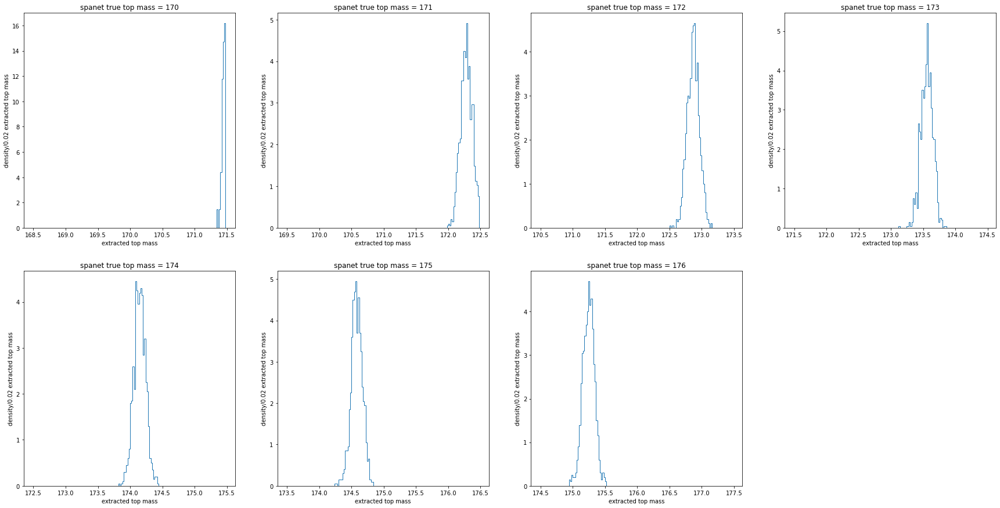

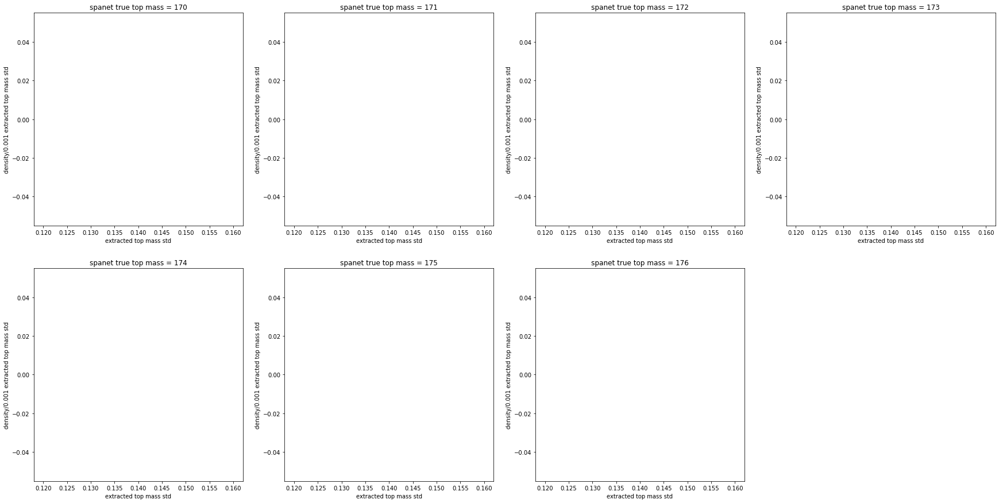

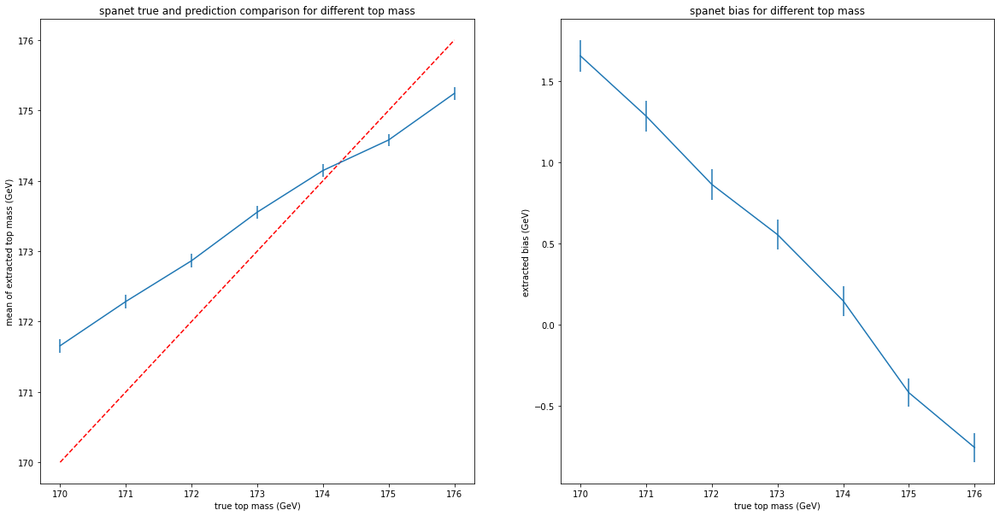

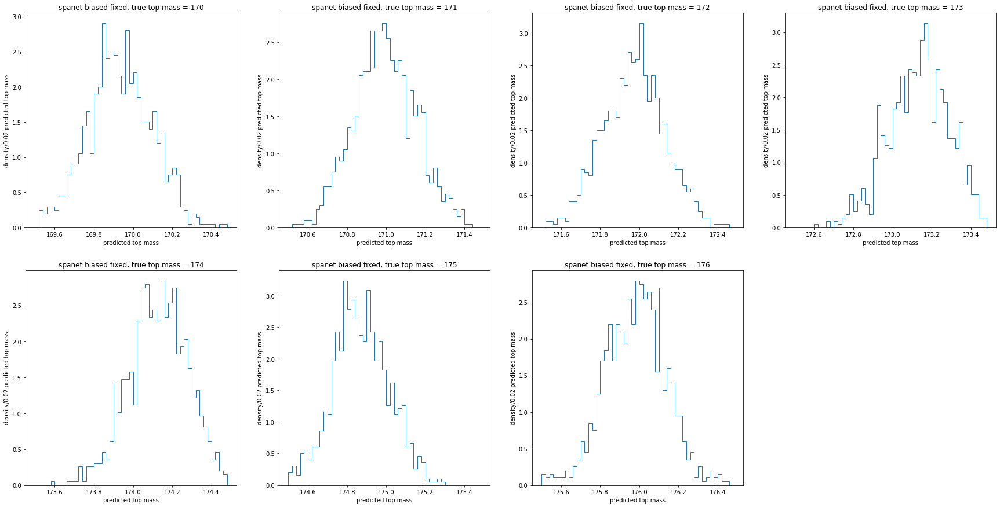

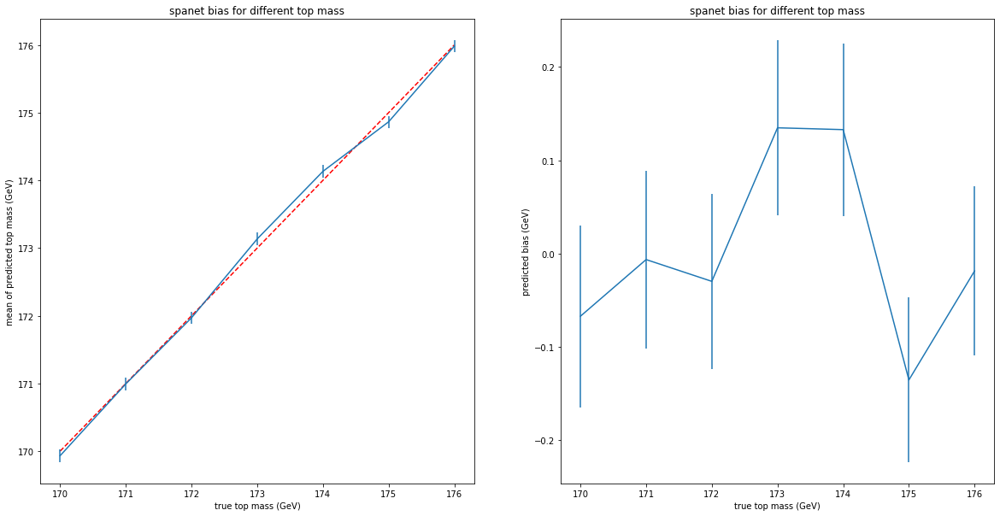

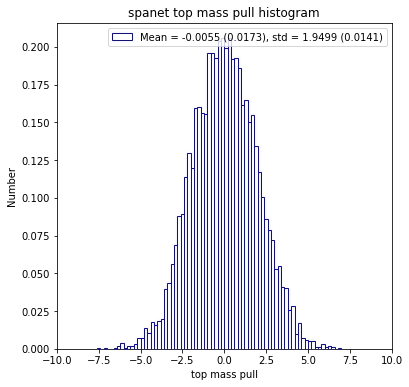

In [69]:
# Plots for spanet top mass
JSF = 1
plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_spanet_top_mean_dic[(m, JSF)], bins=np.arange(m-1.5, m+1.5, 0.02), density=True, histtype='step')
    plt.title('spanet true top mass = {}'.format(m))
    plt.xlabel('extracted top mass')
    plt.ylabel('density/0.02 extracted top mass')
plt.show()

plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_spanet_top_std_dic[(m, JSF)], bins=np.arange(0.12, 0.16, 0.001), density=True, histtype='step')
    plt.title('spanet true top mass = {}'.format(m))
    plt.xlabel('extracted top mass std')
    plt.ylabel('density/0.001 extracted top mass std')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(mass, mass, 'r--')
plt.errorbar(mass, [np.mean(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass], yerr=[np.std(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('spanet true and prediction comparison for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('mean of extracted top mass (GeV)')
plt.subplot(1, 2, 2)
plt.errorbar(mass, [np.mean(sudo_spanet_top_mean_dic[(m, JSF)])-m for m in mass], yerr=[np.std(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('spanet bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('extracted bias (GeV)')
plt.show()

spanet_top_popt, _ = optimize.curve_fit(linear, mass, [np.mean(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass], sigma=[np.std(sudo_spanet_top_mean_dic[(m, JSF)])/np.sqrt(sudo_event) for m in mass], method="lm")
def predicted_spanet_top_func(extracted_top): return (np.array(extracted_top) - spanet_top_popt[1])/spanet_top_popt[0]

plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    bins_top = np.arange(m-0.5, m+0.5, 0.02)
    plt.hist(predicted_spanet_top_func(sudo_spanet_top_mean_dic[(m, JSF)]), bins=bins_top, density=True, histtype='step')
    plt.title('spanet biased fixed, true top mass = {}'.format(m))
    plt.xlabel('predicted top mass')
    plt.ylabel('density/0.02 predicted top mass')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(mass, mass, 'r--')
plt.errorbar(mass, [np.mean(predicted_spanet_top_func(sudo_spanet_top_mean_dic[(m, JSF)])) for m in mass], yerr=[np.std(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('spanet bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('mean of predicted top mass (GeV)')
plt.subplot(1, 2, 2)
plt.errorbar(mass, [np.mean(predicted_spanet_top_func(sudo_spanet_top_mean_dic[(m, JSF)]))-m for m in mass], yerr=[np.std(sudo_spanet_top_mean_dic[(m, JSF)]) for m in mass])
plt.title('spanet bias for different top mass')
plt.xlabel('true top mass (GeV)')
plt.ylabel('predicted bias (GeV)')
plt.show()

plt.figure(figsize = (6, 6))
spanet_top_pull = [(predicted_spanet_top_func(sudo_spanet_top_mean_dic[(m, JSF)])-m)/sudo_spanet_top_std_dic[(m, JSF)] for m in mass]
hist, bin_edges = np.histogram(spanet_top_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
spanet_top_pull_mean, spanet_top_pull_mean_std, spanet_top_pull_sigma, spanet_top_pull_sigma_std = popt[0], perr[0], popt[1], perr[1]
plt.title('spanet top mass pull histogram')
plt.xlim(-10, 10)
plt.xlabel('top mass pull')
plt.ylabel('Number')
plt.legend(loc='upper right')
plt.show()

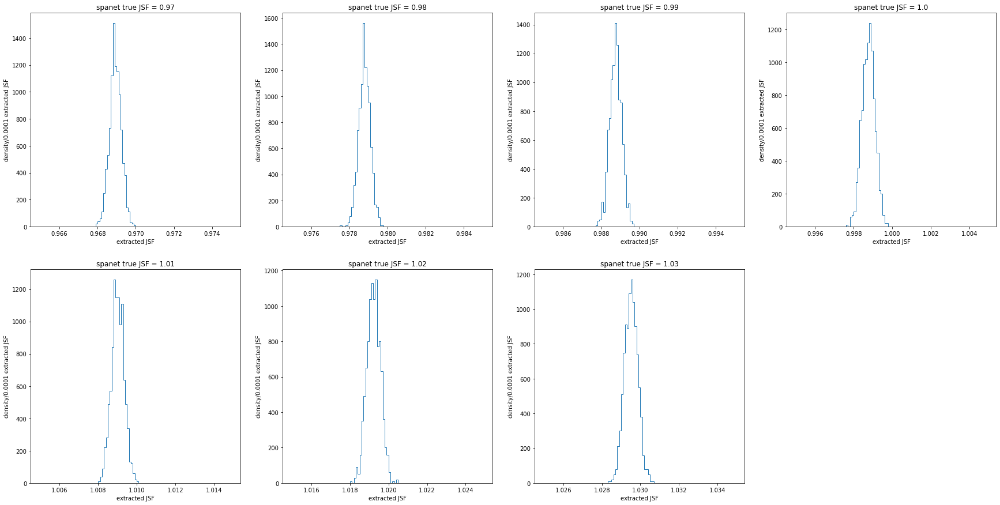

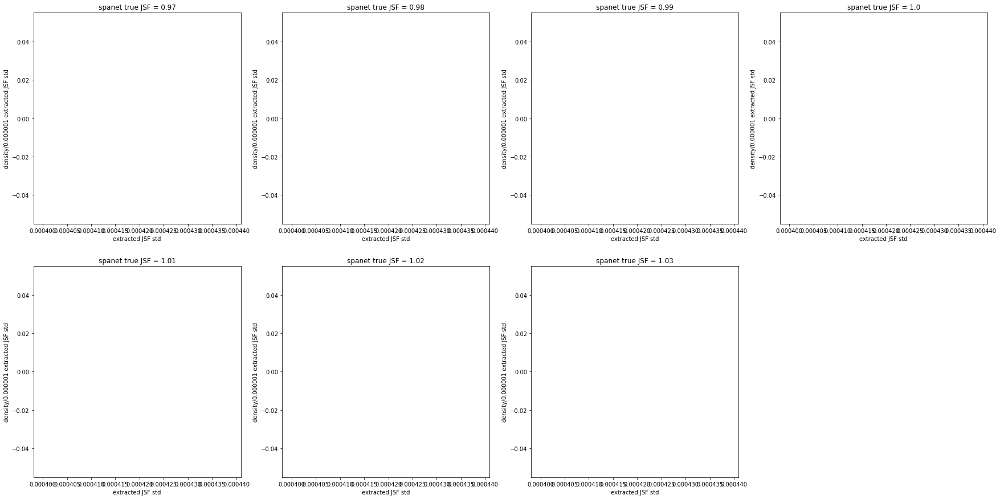

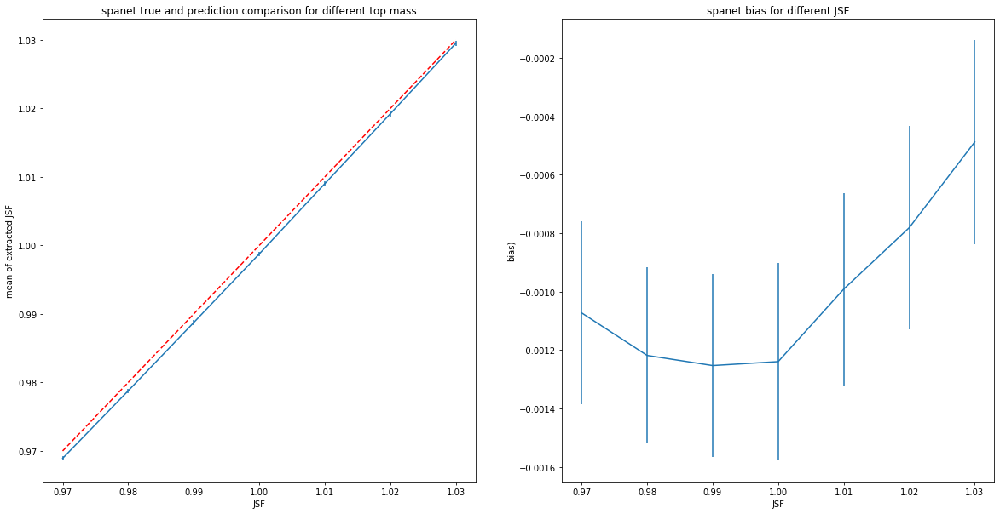

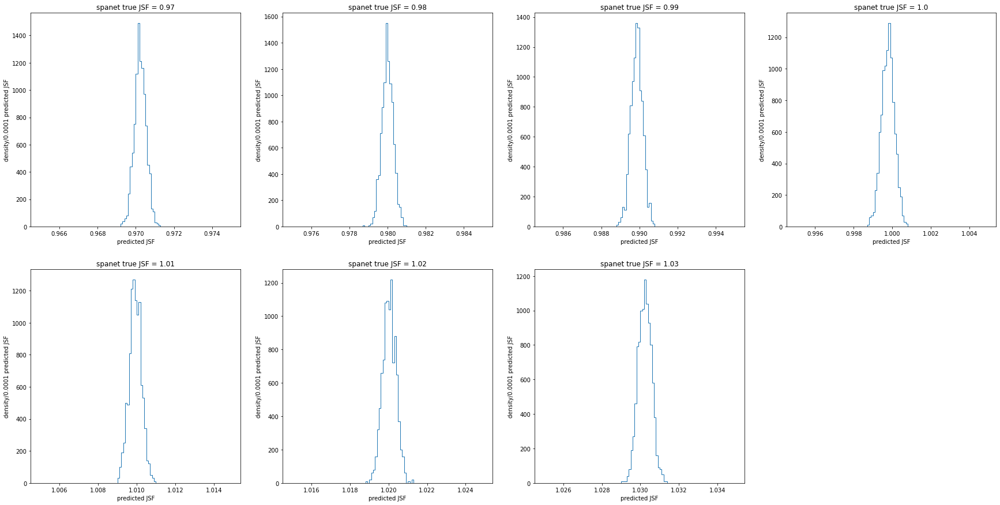

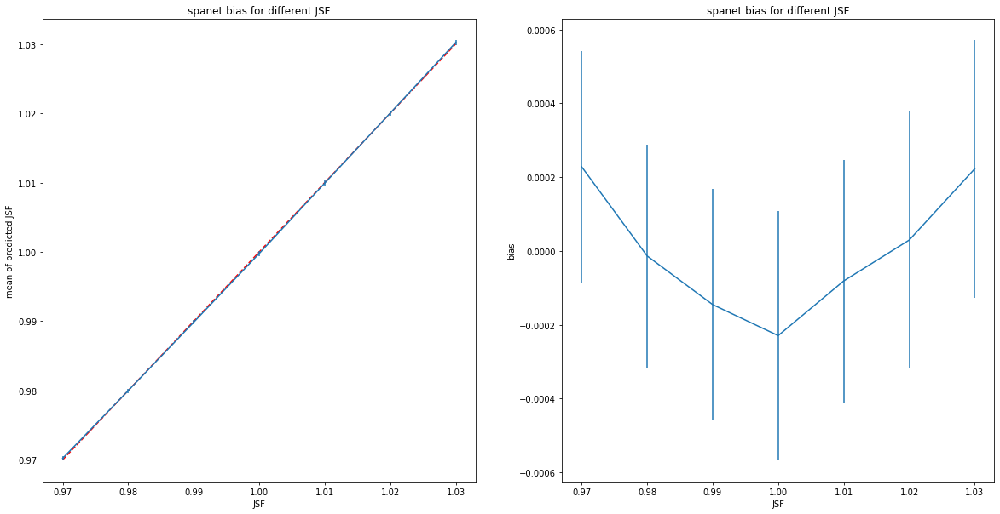

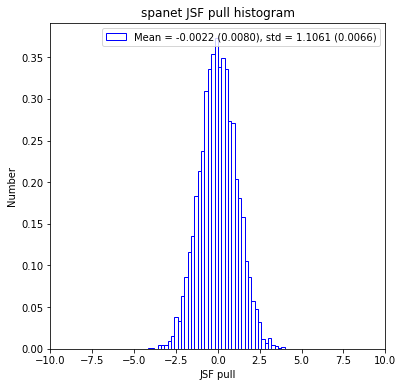

In [67]:
# Plots for spanet JSF
m = 173
plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_spanet_JSF_mean_dic[(m, JSF)], bins=np.arange(JSF-0.005, JSF+0.005, 0.0001), density=True, histtype='step')
    plt.title('spanet true JSF = {}'.format(JSF))
    plt.xlabel('extracted JSF')
    plt.ylabel('density/0.0001 extracted JSF')
plt.show()

plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(sudo_spanet_JSF_std_dic[(m, JSF)], bins=np.arange(0.00040, 0.00044, 0.000001), density=True, histtype='step')
    plt.title('spanet true JSF = {}'.format(JSF))
    plt.xlabel('extracted JSF std')
    plt.ylabel('density/0.000001 extracted JSF std')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(JSF_arr, JSF_arr, 'r--')
plt.errorbar(JSF_arr, [np.mean(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr], yerr=[np.std(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('spanet true and prediction comparison for different top mass')
plt.xlabel('JSF')
plt.ylabel('mean of extracted JSF')
plt.subplot(1, 2, 2)
plt.errorbar(JSF_arr, [np.mean(sudo_spanet_JSF_mean_dic[(m, JSF)])-JSF for JSF in JSF_arr], yerr=[np.std(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('spanet bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('bias)')
plt.show()

spanet_JSF_popt, _ = optimize.curve_fit(linear, JSF_arr, [np.mean(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr], sigma=[np.std(sudo_spanet_JSF_mean_dic[(m, JSF)])/np.sqrt(sudo_event) for JSF in JSF_arr], method="lm")
def predicted_spanet_JSF_func(extracted_JSF): return (np.array(extracted_JSF) - spanet_JSF_popt[1])/spanet_JSF_popt[0]

plt.figure(figsize=(30,15))
for i, JSF in enumerate(JSF_arr):
    plt.subplot(2, 4, i+1)
    plt.hist(predicted_spanet_JSF_func(sudo_spanet_JSF_mean_dic[(m, JSF)]), bins=np.arange(JSF-0.005, JSF+0.005, 0.0001), density=True, histtype='step')
    plt.title('spanet true JSF = {}'.format(JSF))
    plt.xlabel('predicted JSF')
    plt.ylabel('density/0.0001 predicted JSF')
plt.show()

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.plot(JSF_arr, JSF_arr, 'r--')
plt.errorbar(JSF_arr, [np.mean(predicted_spanet_JSF_func(sudo_spanet_JSF_mean_dic[(m, JSF)])) for JSF in JSF_arr], yerr=[np.std(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('spanet bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('mean of predicted JSF')
plt.subplot(1, 2, 2)
plt.errorbar(JSF_arr, [np.mean(predicted_spanet_JSF_func(sudo_spanet_JSF_mean_dic[(m, JSF)]))-JSF for JSF in JSF_arr], yerr=[np.std(sudo_spanet_JSF_mean_dic[(m, JSF)]) for JSF in JSF_arr])
plt.title('spanet bias for different JSF')
plt.xlabel('JSF')
plt.ylabel('bias')
plt.show()

plt.figure(figsize = (6, 6))
spanet_JSF_pull = [(predicted_spanet_JSF_func(sudo_spanet_JSF_mean_dic[(m, JSF)])-JSF)/sudo_spanet_JSF_std_dic[(m, JSF)] for JSF in JSF_arr]
hist, bin_edges = np.histogram(spanet_JSF_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
spanet_JSF_pull_mean, spanet_JSF_pull_mean_std, spanet_JSF_pull_sigma, spanet_JSF_pull_sigma_std = popt[0], perr[0], popt[1], perr[1]
plt.title('spanet JSF pull histogram')
plt.xlim(-10, 10)
plt.xlabel('JSF pull')
plt.ylabel('Number')
plt.legend(loc='upper right')
plt.show()

In [ ]:
true_top_arr = []
true_JSF_arr = []
mean_extracted_top_arr = []
mean_extracted_JSF_arr = []
for m in mass:
    for JSF in JSF_arr:
        true_top_arr.append(m)
        true_JSF_arr.append(JSF)
        mean_extracted_top_arr.append(np.mean(sudo_spanet_top_mean_dic[(m, JSF)]))
        mean_extracted_JSF_arr.append(np.mean(sudo_spanet_JSF_mean_dic[(m, JSF)]))
true_top_arr = np.array(true_top_arr)
true_JSF_arr = np.array(true_JSF_arr)
mean_extracted_top_arr = np.array(mean_extracted_top_arr)
mean_extracted_JSF_arr = np.array(mean_extracted_JSF_arr)

def extract_pred(extracted_top, extracted_JSF, a, b, c, d):
    return a + b*(extracted_top-173) + c*(extracted_JSF-1) + d*(extracted_top-173)*(extracted_JSF-1)
def extract_pred_top_fcn(a, b, c, d):
    return np.sum((-true_top_arr + a + b*(mean_extracted_top_arr-173) + c*(mean_extracted_JSF_arr-1) + d*(mean_extracted_top_arr-173)*(mean_extracted_JSF_arr-1))**2)
def extract_pred_JSF_fcn(a, b, c, d):
    return np.sum((-true_JSF_arr + a + b*(mean_extracted_top_arr-173) + c*(mean_extracted_JSF_arr-1) + d*(mean_extracted_top_arr-173)*(mean_extracted_JSF_arr-1))**2)

minuit = Minuit(extract_pred_top_fcn, 1, 1, 1, 1)
minuit.migrad()
minuit.minos()
extract_pred_spanet_top_popt = list(minuit.values)
minuit = Minuit(extract_pred_JSF_fcn, 1, 1, 1, 1)
minuit.migrad()
minuit.minos()
extract_pred_spanet_JSF_popt = list(minuit.values)

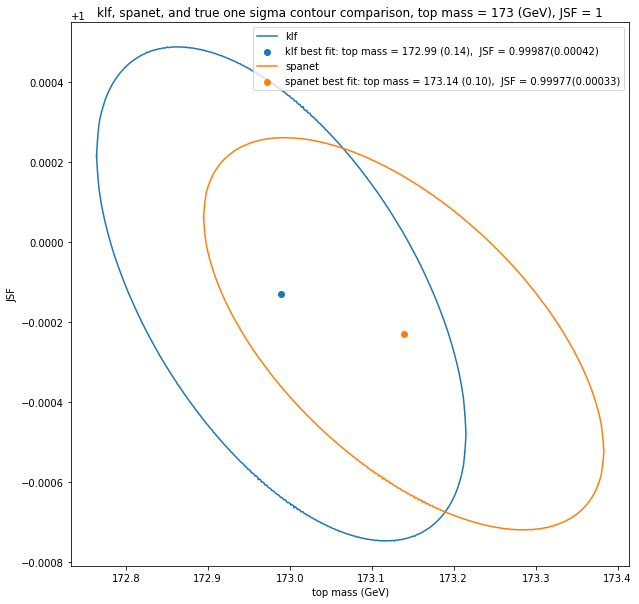

In [44]:
plt.figure(figsize=(10, 10))
m, JSF = 173, 1

reco_klf_top = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n1 = np.histogram(reco_klf_top, bins=top_bins)[0]
reco_klf_W = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n2 = np.histogram(reco_klf_W, bins=W_bins)[0]

minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(predicted_klf_top_func(x), predicted_klf_JSF_func(y), '-', label='klf')
predicted_klf_top, predicted_klf_JSF = predicted_klf_top_func(minuit.values[0]), predicted_klf_JSF_func(minuit.values[1])
plt.scatter(predicted_klf_top, predicted_klf_JSF, label='klf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(predicted_klf_top, minuit.errors[0], predicted_klf_JSF, minuit.errors[1]))

reco_spanet_top = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n1 = np.histogram(reco_spanet_top, bins=top_bins)[0]
reco_spanet_W = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n2 = np.histogram(reco_spanet_W, bins=W_bins)[0]

minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(predicted_spanet_top_func(x), predicted_spanet_JSF_func(y), '-', label='spanet')
predicted_spanet_top, predicted_spanet_JSF = predicted_spanet_top_func(minuit.values[0]), predicted_spanet_JSF_func(minuit.values[1])
plt.scatter(predicted_spanet_top, predicted_spanet_JSF, label='spanet best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(predicted_spanet_top, minuit.errors[0], predicted_spanet_JSF, minuit.errors[1]))

# reco_true_top = reco_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
# n1 = np.histogram(reco_true_top, bins=top_bins)[0]
# reco_true_W = W_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
# n2 = np.histogram(reco_true_W, bins=W_bins)[0]

# minuit = Minuit(chi2_true_arr_func, m=m, JSF=JSF)
# minuit.migrad()
# minuit.minos()
# pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
# x, y = np.transpose(pts)
# plt.plot(x, y, '-', label='true')
# plt.scatter(minuit.values[0], minuit.values[1], label='true best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

plt.title('klf, spanet, and true one sigma contour comparison, top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend(loc = 'upper right')
plt.show()

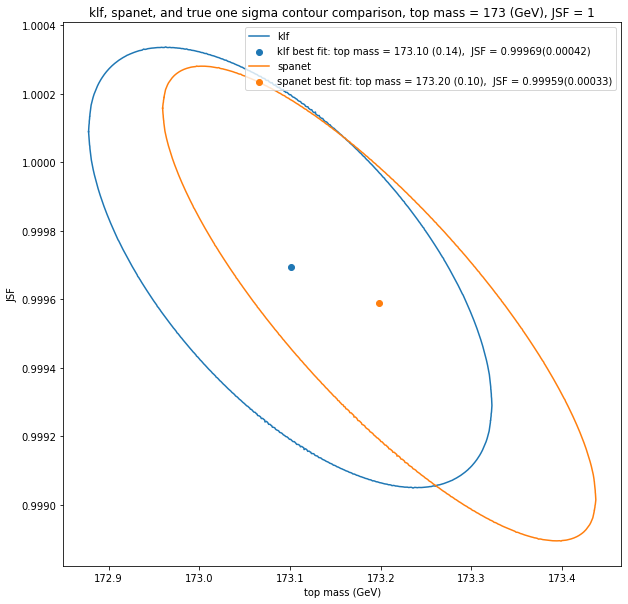

In [45]:
plt.figure(figsize=(10, 10))
m, JSF = 173, 1

reco_klf_top = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n1 = np.histogram(reco_klf_top, bins=top_bins)[0]
reco_klf_W = W_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n2 = np.histogram(reco_klf_W, bins=W_bins)[0]

minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(extract_pred(x, y, *extract_pred_klf_top_popt), extract_pred(x, y, *extract_pred_klf_JSF_popt), '-', label='klf')
predicted_klf_top, predicted_klf_JSF = extract_pred(minuit.values[0], minuit.values[1], *extract_pred_klf_top_popt), extract_pred(minuit.values[0], minuit.values[1], *extract_pred_klf_JSF_popt)
plt.scatter(predicted_klf_top, predicted_klf_JSF, label='klf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(predicted_klf_top, minuit.errors[0], predicted_klf_JSF, minuit.errors[1]))

reco_spanet_top = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n1 = np.histogram(reco_spanet_top, bins=top_bins)[0]
reco_spanet_W = W_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n2 = np.histogram(reco_spanet_W, bins=W_bins)[0]

minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(extract_pred(x, y, *extract_pred_spanet_top_popt), extract_pred(x, y, *extract_pred_spanet_JSF_popt), '-', label='spanet')
predicted_spanet_top, predicted_spanet_JSF = extract_pred(minuit.values[0], minuit.values[1], *extract_pred_spanet_top_popt), extract_pred(minuit.values[0], minuit.values[1], *extract_pred_spanet_JSF_popt)
plt.scatter(predicted_spanet_top, predicted_spanet_JSF, label='spanet best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(predicted_spanet_top, minuit.errors[0], predicted_spanet_JSF, minuit.errors[1]))

# reco_true_top = reco_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
# n1 = np.histogram(reco_true_top, bins=top_bins)[0]
# reco_true_W = W_true_dic[(m, JSF)][np.logical_and.reduce((cut_true_dic[(m, JSF)], state_true_dic[(m, JSF)] == 2))]
# n2 = np.histogram(reco_true_W, bins=W_bins)[0]

# minuit = Minuit(chi2_true_arr_func, m=m, JSF=JSF)
# minuit.migrad()
# minuit.minos()
# pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
# x, y = np.transpose(pts)
# plt.plot(x, y, '-', label='true')
# plt.scatter(minuit.values[0], minuit.values[1], label='true best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

plt.title('klf, spanet, and true one sigma contour comparison, top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend(loc = 'upper right')
plt.show()